In [1]:
'''
Date: 20/Jan/2022
Auther: Yike Xie
Content: Figure 3 in dengue paper
'''

'\nDate: 20/Jan/2022\nAuther: Yike Xie\nContent: Figure 3 in dengue paper\n'

In [2]:
import os

import numpy as np
import pandas as pd

import anndata
import scanpy as sc

import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
from matplotlib.collections import PatchCollection
from matplotlib import gridspec
import matplotlib as mpl
import seaborn as sns

from collections import defaultdict
import random
import itertools
from numpy import *    

In [3]:
import sys
sys.path.append('/home/yike/phd/dengue/dengue_children/paper_figures/final/modules') 
import YK_util, optimized_pair_comparison, functions_CCC_figure_fra_pair
from YK_util import *
from optimized_pair_comparison import *
from functions_CCC_figure_fra_pair import *

In [4]:
# load data
path = '/home/yike/phd/dengue/data/mergedata_20211001.h5ad'
adata = sc.read_h5ad(path)
adata_kid = subsetdata(adata)
adata_kid = normalizedata(adata_kid, log1p=True) # log1p = 2
adata_kid = removegenes(adata_kid)
adata_kid = adata_kid[(adata_kid.obs.cell_subtype_new != 'doublets') & 
                        (adata_kid.obs.cell_subtype_new != 'unknown')].copy()

sc.pp.filter_genes(adata_kid, min_cells=3)

In [5]:
#rename and reorder some celltypes 
adata_kid = adata_kid.copy()
reorg_celltype(adata_kid) # 'cell_type_new', 'cell_subtype_new'

In [6]:
#save path
save_figures = '/home/yike/phd/dengue/docs/paper_draft/figures/figure_3/'
save_tables = '/home/yike/phd/dengue/docs/paper_draft/tabels/'

In [7]:
# get cell types and cell subtypes
cell_types = adata_kid.obs['cell_type_new'].unique().tolist()
cell_subtypes = adata_kid.obs['cell_subtype_new'].unique().tolist()

In [8]:
# load cell type palette
ct_palette = load_ct_palette()
print([ct for ct in ct_palette.keys()])
sns.color_palette(ct_palette.values())

['B cells', 'Plasmablasts', 'T cells', 'NK cells', 'Monocytes', 'conventional DCs', 'plasmacytoid DCs', 'megakaryocytes']


[(0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451)]

In [9]:
# load cell subtype palette
cst_palette = load_cst_palette()
print([cst for cst in cst_palette.keys()])
sns.color_palette(cst_palette.values())

['memory B cells', 'naive B cells', 'activated B cells', 'proliferating plasmablasts', 'non-proliferating plasmablasts', 'CD4+ T cells', 'CD8+ effector T cells', 'CD8+ naive/memory T cells', 'signaling NK cells', 'cytotoxic NK cells', 'classical monocytes', 'non-classical monocytes', 'intermediate monocytes', 'conventional DCs', 'plasmacytoid DCs', 'megakaryocytes']


[(1.0, 0.0, 0.0),
 (0.7372549019607844, 0.5607843137254902, 0.5607843137254902),
 (0.5019607843137255, 0.0, 0.0),
 (1.0, 0.8941176470588236, 0.7686274509803922),
 (1.0, 0.5490196078431373, 0.0),
 (0.6901960784313725, 0.7686274509803922, 0.8705882352941177),
 (0.2549019607843137, 0.4117647058823529, 0.8823529411764706),
 (0.0, 0.0, 0.5019607843137255),
 (0.5019607843137255, 0.0, 0.5019607843137255),
 (0.8666666666666667, 0.6274509803921569, 0.8666666666666667),
 (0.5607843137254902, 0.7372549019607844, 0.5607843137254902),
 (0.5647058823529412, 0.9333333333333333, 0.5647058823529412),
 (0.0, 0.5019607843137255, 0.0),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451)]

In [10]:
def frac_df(adata):     
    temp = adata[(adata.obs['cell_subtype_new'] != 'unknown') & (adata.obs['cell_subtype_new'] != 'doublets')].copy()
    temp = temp[(temp.obs['ID'] != '1_075_01') & (temp.obs['ID'] != '6_029_01')]
    cell_subtypes = temp.obs['cell_subtype_new'].unique().tolist()
    IDs = {cst: list(temp[temp.obs['cell_subtype_new'] == cst].obs['ID'].unique()) for cst in cell_subtypes}
    cds = ['Healthy', 'dengue', 'DWS', 'S_dengue']

    df = pd.DataFrame()
    fra_ct, cd, cst, patient = [], [], [], []

    for csti, ID in IDs.items():
        temp_cst = temp[temp.obs['cell_subtype_new'] == csti]
        ct = temp_cst.obs['cell_type_new'].unique()[0]
        for IDi in ID:
            cdi = temp_cst[temp_cst.obs['ID'] == IDi].obs['Condition'].unique()[0]
            cell_cst = temp_cst[temp_cst.obs['ID'] == IDi].obs.shape[0]
            total_ct = temp[(temp.obs['ID'] == IDi) & (temp.obs['cell_type_new'] == ct)].obs.shape[0]
           
            if total_ct == 0:
                continue
            cd.append(cdi)
            cst.append(csti)
            patient.append(IDi)
            fra_ct.append(cell_cst / total_ct * 100)
            
    df['cst'] = cst
    df['Condition'] = cd
    df['ID'] = patient
    df['fra_ct'] = fra_ct
    
    df['Condition'].replace({'dengue': 'Dengue/DWS',
                            'DWS': 'Dengue/DWS',
                            'S_dengue': 'Severe dengue'},
                            inplace=True)
    df.set_index('cst', inplace=True)
    
    return df

def frac_barplot(adata, cell_type, df, path, filetype=False):
    
    #rcParams['figure.figsize']=(7,7)
    rcParams['font.size']= 20
    rcParams['pdf.fonttype'] = 42
    rcParams['figure.dpi'] = 300
    rcParams['font.sans-serif'] = "Arial"
    
    temp = adata[(adata.obs['cell_subtype_new'] != 'unknown') & 
                 (adata.obs['cell_subtype_new'] != 'doublets')].copy()
    temp = temp[(temp.obs['ID'] != '1_075_01') & (temp.obs['ID'] != '6_029_01')]
    
    cst = temp[temp.obs['cell_type_new'] == cell_type].obs['cell_subtype_new'].unique()

    fig, axs = plt.subplots(1, len(cst), figsize=[len(cst)*5, 6])
    cmap = sns.color_palette('Set2', 4)
    palette = [cmap[0], cmap[1], cmap[3]]
    
    for csti, ax in zip(cst, axs):
        df_cst = df.loc[csti].set_index('Condition').loc[['Healthy', 'Dengue/DWS', 'Severe dengue']].reset_index()
        
        sns.boxplot(data = df_cst, 
                    x = 'Condition', y = 'fra_ct', ax=ax, width=0.5, palette=palette) #, showfliers = False
        
        sns.stripplot(data = df_cst, 
                      x = 'Condition', y = 'fra_ct', color='k', s=5, ax=ax)
        ax.set(ylabel=None, 
               xlabel=None,
               title=csti,
              )
        ax.set_xticklabels(['Healthy', 'Dengue/DWS', 'Severe dengue'], rotation=45)
    axs[0].set_ylabel('Cell fraction')
    fig.tight_layout()
    
    if filetype is not False:
        name = cell_type + '_fraction' + filetype
        fig.savefig(os.path.join(path, name), bbox_inches='tight')

def cell_abundance(df, cst_order, path, filetype):    
    rcParams['font.size']= 20
    rcParams['pdf.fonttype'] = 42
    rcParams['figure.dpi'] = 300
    rcParams['font.sans-serif'] = "Arial"

    fig, ax = plt.subplots(figsize=[len(cst_order)*1.5, 10])
    cmap = sns.color_palette('Set2', 4)
    palette = [cmap[0], cmap[1], cmap[3]]

    PROPS = {
        'boxprops':{'edgecolor':'white'},
        'medianprops':{'color':'white'},
        'whiskerprops':{'color':'none'},
        'capprops':{'color':'none'}
    }

    df_show = df[df['cst'].isin(cst_order)]
    df_show = df_show.set_index('cst').loc[cst_order].reset_index()
    sns.boxplot(data = df_show, 
                x = 'cst', y = 'fra_ct', hue='Condition', 
                hue_order=['Healthy', 'Dengue/DWS', 'Severe dengue'], 
                palette=palette, width=0.8, ax=ax, showfliers=False, **PROPS)
    sns.stripplot(data = df_show, 
                  x = 'cst', y = 'fra_ct', hue='Condition', 
                  hue_order=['Healthy', 'Dengue/DWS', 'Severe dengue'], 
                  palette=palette, s=7, ax=ax, edgecolor='white', linewidth=1, dodge=True)
    ax.legend(bbox_to_anchor=(1, 1))
    ax.set_ylabel('Fraction of cells (%)')
    ax.set_xlabel(None)
    labels = [x.get_text() for x in ax.get_xticklabels()]
    ax.set_xticklabels(labels, rotation=45)
    fig.tight_layout()

    if filetype is not False:
        name = 'cell_abundance' + filetype
        fig.savefig(os.path.join(path, name), bbox_inches='tight')
        
    return {'figure': figure, 'ax': ax}
        
# figure 3B
def viral_load_abundance(adata, cell_subtype, path, filetype=False):
    rcParams['figure.figsize']=(6,6)
    rcParams['font.size']= 18
    rcParams['pdf.fonttype'] = 42
    rcParams['figure.dpi'] = 300
    rcParams['font.sans-serif'] = "Arial"
    
    adata = adata[(adata.obs['ID'] != '1_075_01') & (adata.obs['ID'] != '6_029_01')]
    
    viral_loads = adata.obs[['viral_load_qpcr', 'ID']].groupby('ID').mean()['viral_load_qpcr'] / adata.obs[['n_counts', 'ID']].groupby('ID').sum()['n_counts'] * 1e6
    x = np.log2(viral_loads + 1).to_frame()
    x.columns = ['viral load/million reads']
    
    cell_type = adata[adata.obs['cell_subtype_new'] == cell_subtype].obs['cell_type_new'][0]
    y = {}
    for ID in adata.obs['ID'].unique():
        n_ct = adata[(adata.obs['ID'] == ID) & (adata.obs['cell_type_new'] == cell_type)].obs.shape[0]
        if n_ct == 0:
            continue
        n_cst = adata[(adata.obs['ID'] == ID) & 
                         (adata.obs['cell_subtype_new'] == cell_subtype)].obs.shape[0]
        y[ID] = n_cst / n_ct * 100

    x = x.loc[y.keys()]
    x['Fraction of cells (%)'] = [y[i] for i in x.index]
    x['Condition'] = [adata[adata.obs['ID'] == ID].obs['Condition'][0] for ID in x.index]
    x['Condition'].replace({
        'dengue': 'D/DWS',
        'DWS': 'D/DWS',
        'S_dengue': 'SD'
    }, inplace=True)
    
    #############################
    
    cmap = sns.color_palette('Set2', 4)
    palette = [cmap[0], cmap[1], cmap[3]]
    
    fig, ax = plt.subplots()
    sns.scatterplot(data=x, x='viral load/million reads', y='Fraction of cells (%)', s=200, ax=ax, hue='Condition', 
                hue_order=['Healthy', 'D/DWS', 'SD'],
                palette=palette)
    
    ax.legend(bbox_to_anchor=(1, 1))
    
    ax.set_title(cell_subtype)
#     ax.set_ylabel('Cell fraction')
#     ax.set_xlabel('Viral load (qPCR)/million')
    ax.set_xlim(-1, 40)
    ax.set_xticks([0, np.log2(1e4), np.log2(1e8), np.log2(1e12)])
    ax.set_xticklabels(['0', '$10^4$', '$10^8$','$10^1$'+'$^2$'])
    
    if filetype is not False:
        name = cell_subtype + '_viral_load_fraction' + filetype
        fig.savefig(os.path.join(path, name), bbox_inches='tight')
    
    from scipy.stats import spearmanr, pearsonr
    spr1 = spearmanr(x['viral load/million reads'].values, x['Fraction of cells (%)'].values)
    per1 = pearsonr(x['viral load/million reads'].values, x['Fraction of cells (%)'].values)

    x2 = x[x['Condition'] != 'Healthy']
    spr2 = spearmanr(x2['viral load/million reads'].values, x2['Fraction of cells (%)'].values)
    per2 = pearsonr(x2['viral load/million reads'].values, x2['Fraction of cells (%)'].values)

    return {'spearmanr (with healthy)': spr1,
            'pearsonr (with healthy)': per1,
            'spearmanr (w/o healthy)': spr2,
            'pearsonr (w/o healthy)': per2}

def umap_marker(adata, gene, cell_type, path, filetype=False):
    rcParams['figure.figsize']=(7,7)
    rcParams['font.size']= 20
    rcParams['pdf.fonttype'] = 42
    rcParams['figure.dpi'] = 300
    rcParams['font.sans-serif'] = "Arial"

    fig, ax = plt.subplots()
    sc.pl.umap(adata, color=gene, ax=ax, show=False)
    if filetype is not False:
        name = cell_type + '_' + gene + filetype
        fig.savefig(os.path.join(path, name), bbox_inches='tight')
        
def annanote_adult(adata_adult): 
    adata_adult.obs['cell_type_new'] = adata_adult.obs['cell_type']
    adata_adult.obs['cell_type_new'] = adata_adult.obs['cell_type_new'].astype('object')
    adata_adult.obs['cell_subtype_new'] = adata_adult.obs['cell_subtype_new'].astype('object')
    
    adata_adult.obs.loc[adata_adult.obs['cell_type_new'] == 'NK_cells', 'cell_type_new'] = 'NK cells'
    ####################################
    
    for gene in ['GZMA',  'NKG7', 'GNLY', 'XCL1', 'XCL2', 'FCGR3A', 'CCND2', 'MKI67']:
            adata_adult.obs[gene] = (adata_adult[:, gene].X.toarray() > 0)
    
    ####################  
    adata_adult.obs.loc[adata_adult.obs['cell_type_new'] == 'NK cells', 'cell_type_new'] = 'NK_unknown'
    idx_NK = ((adata_adult.obs['cell_type_new'] == 'NK_unknown') &
             (adata_adult.obs['GZMA'] == True) &
             (adata_adult.obs['NKG7'] == True) &
             (adata_adult.obs['GNLY'] == True) )
    adata_adult.obs.loc[idx_NK, 'cell_type_new'] = 'NK cells'
    
    adata_adult.obs.loc[adata_adult.obs['cell_type_new'] == 'NK cells', 'cell_subtype_new'] = 'cytotoxic NK cells'
    idx_sig_NK = ((adata_adult.obs['cell_type_new'] == 'NK cells') & 
                        (adata_adult.obs['XCL1'] == True) & 
                        (adata_adult.obs['XCL2'] == True) &
                        (adata_adult.obs['FCGR3A'] == True))
    adata_adult.obs.loc[idx_sig_NK, 'cell_subtype_new'] = 'signaling NK cells'
    
    ####################
    adata_adult.obs.loc[adata_adult.obs['cell_type_new'] == 'Plasmablasts', 'cell_subtype_new'] = 'non-proliferating plasmablasts'
    idx_P = ((adata_adult.obs['cell_type_new'] == 'Plasmablasts') & 
                        (adata_adult.obs['CCND2'] == True) & 
                        (adata_adult.obs['MKI67'] == True))
    adata_adult.obs.loc[idx_P, 
                        'cell_subtype_new'] = 'proliferating plasmablasts'
    
    ####################
    adata_adult.obs['cell_type_new'] = adata_adult.obs['cell_type_new'].astype('category')
    adata_adult.obs['cell_subtype_new'] = adata_adult.obs['cell_subtype_new'].astype('category')    
    return adata_adult

In [11]:
df_frac = frac_df(adata_kid)

order = ['naive B cells', 'memory B cells', 'activated B cells', 
                'non-proliferating plasmablasts', 'proliferating plasmablasts', 
                'CD4+ T cells', 'CD8+ naive/memory T cells', 'CD8+ effector T cells', 
                'cytotoxic NK cells', 'signaling NK cells', 
                'classical monocytes', 'non-classical monocytes', 'intermediate monocytes',
                'conventional DCs', 'plasmacytoid DCs', 'megakaryocytes']

df_frac = df_frac.loc[order]
df_frac.reset_index(inplace=True)

In [13]:
cst_order = ['naive B cells', 'memory B cells', 'activated B cells', 
                'non-proliferating plasmablasts', 'proliferating plasmablasts', 
                'CD4+ T cells', 'CD8+ naive/memory T cells', 'CD8+ effector T cells', 
                'cytotoxic NK cells', 'signaling NK cells', 
                'classical monocytes', 'non-classical monocytes', 'intermediate monocytes',]

In [22]:
from scipy.stats import ks_2samp, f_oneway, ttest_ind
# sick vs Healthy
frac = df_frac.set_index('cst')
for cst in cst_order:
    heal_fra = frac.loc[cst][frac.loc[cst]['Condition'] == 'Healthy']['fra_ct']
    sick_fra = frac.loc[cst][frac.loc[cst]['Condition'].isin(['Dengue/DWS', 'Severe dengue'])]['fra_ct']
    ks = ks_2samp(heal_fra, sick_fra)
    onew = f_oneway(heal_fra, sick_fra)
    t = ttest_ind(heal_fra, sick_fra)
    print('---------------------------------------------')
    print(cst)
    print('KS test')
    print(ks)
    print('one-way Anova')
    print(onew)
    print('t-test')
    print(t)

---------------------------------------------
naive B cells
KS test
KstestResult(statistic=0.4444444444444444, pvalue=0.4552289815447709)
one-way Anova
F_onewayResult(statistic=0.9074212160309341, pvalue=0.3521712713462959)
t-test
Ttest_indResult(statistic=0.9525865924056113, pvalue=0.3521712713462959)
---------------------------------------------
memory B cells
KS test
KstestResult(statistic=0.7058823529411765, pvalue=0.04611528822055139)
one-way Anova
F_onewayResult(statistic=1.6237440000960777, pvalue=0.21793636036650094)
t-test
Ttest_indResult(statistic=1.2742621394736944, pvalue=0.21793636036650113)
---------------------------------------------
activated B cells
KS test
KstestResult(statistic=0.5555555555555556, pvalue=0.19002050580997948)
one-way Anova
F_onewayResult(statistic=1.4438364268453328, pvalue=0.24355558722019843)
t-test
Ttest_indResult(statistic=-1.2015974479189493, pvalue=0.24355558722019888)
---------------------------------------------
non-proliferating plasmablasts

In [23]:
# non-severe vs severe
for cst in cst_order:
    D_fra = frac.loc[cst][frac.loc[cst]['Condition'] == 'Dengue/DWS']['fra_ct']
    SD_fra = frac.loc[cst][frac.loc[cst]['Condition'] == 'Severe dengue']['fra_ct']
    ks = ks_2samp(D_fra, SD_fra)
    onew = f_oneway(D_fra, SD_fra)
    t = ttest_ind(D_fra, SD_fra)
    print('---------------------------------------------')
    print(cst)
    print('KS test')
    print(ks)
    print('one-way Anova')
    print(onew)
    print('t-test')
    print(t)

---------------------------------------------
naive B cells
KS test
KstestResult(statistic=0.2987012987012987, pvalue=0.7302664655605834)
one-way Anova
F_onewayResult(statistic=0.008838078623884702, pvalue=0.9262675997893463)
t-test
Ttest_indResult(statistic=0.09401105585985454, pvalue=0.92626759978935)
---------------------------------------------
memory B cells
KS test
KstestResult(statistic=0.3, pvalue=0.7533422459893047)
one-way Anova
F_onewayResult(statistic=2.529528252668128, pvalue=0.13258450546382303)
t-test
Ttest_indResult(statistic=-1.5904490726421037, pvalue=0.13258450546382317)
---------------------------------------------
activated B cells
KS test
KstestResult(statistic=0.2727272727272727, pvalue=0.8294369029663147)
one-way Anova
F_onewayResult(statistic=0.05414301453256919, pvalue=0.8189552237599839)
t-test
Ttest_indResult(statistic=0.2326865155795868, pvalue=0.8189552237599856)
---------------------------------------------
non-proliferating plasmablasts
KS test
KstestRes

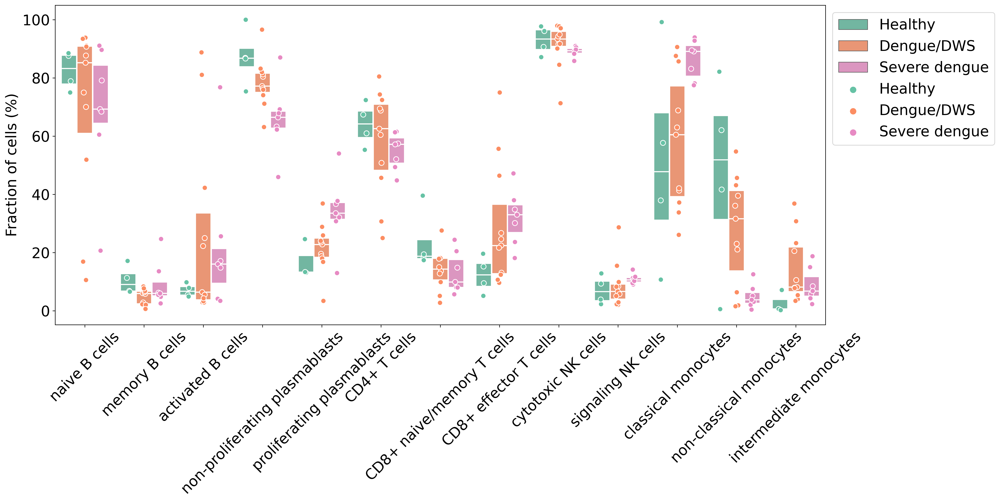

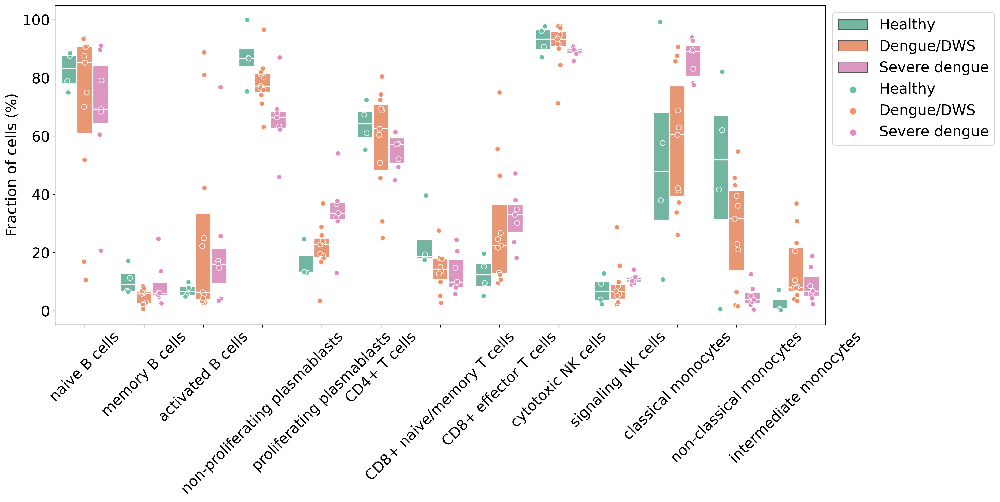

In [20]:
cst_order = ['naive B cells', 'memory B cells', 'activated B cells', 
                'non-proliferating plasmablasts', 'proliferating plasmablasts', 
                'CD4+ T cells', 'CD8+ naive/memory T cells', 'CD8+ effector T cells', 
                'cytotoxic NK cells', 'signaling NK cells', 
                'classical monocytes', 'non-classical monocytes', 'intermediate monocytes',]

cell_abundance(df_frac, cst_order, save_figures, '1.png')
cell_abundance(df_frac, cst_order, save_figures, '1.pdf')

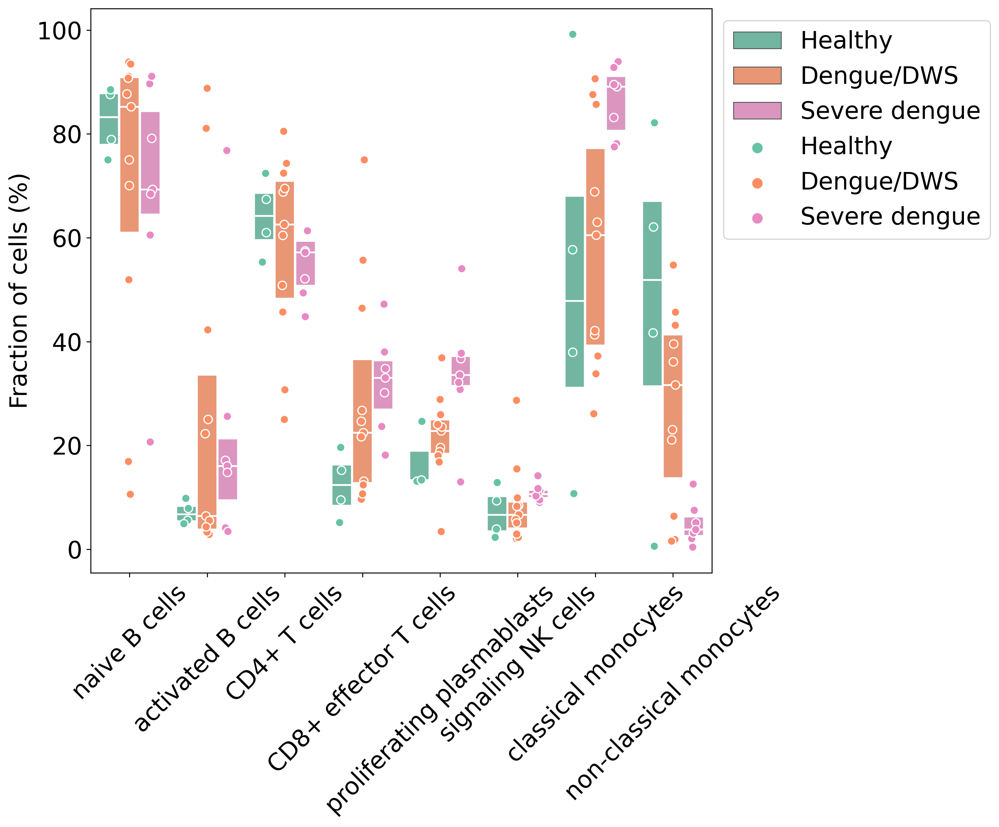

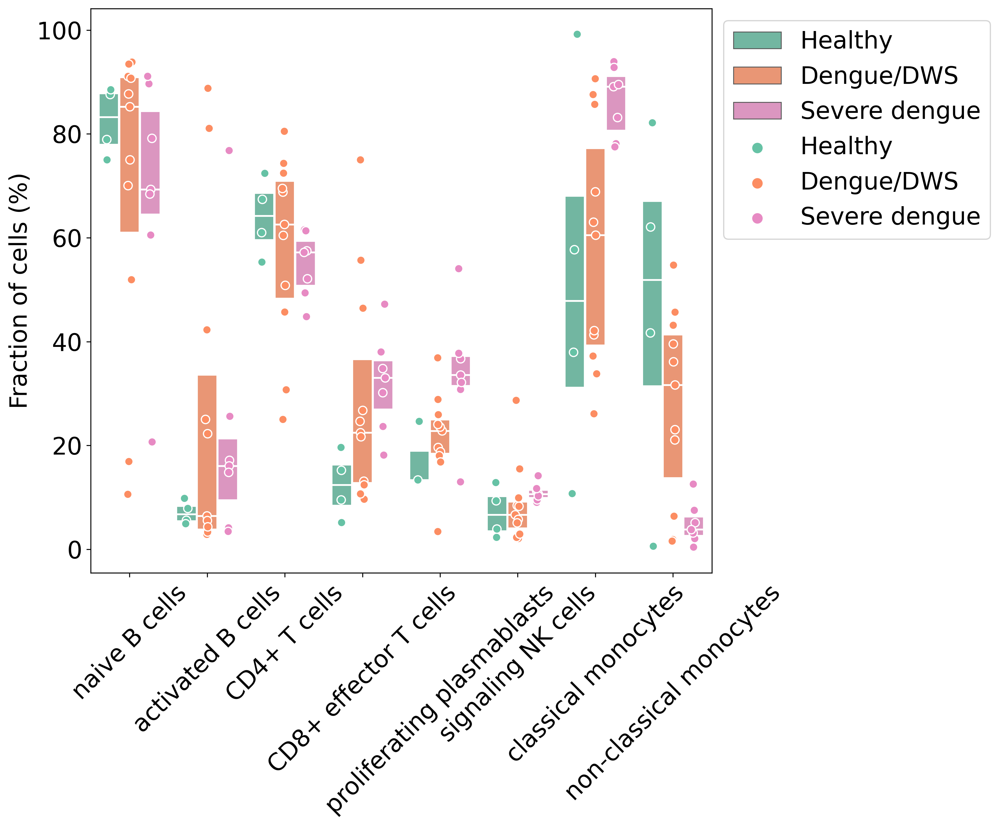

In [21]:
cst_order = ['naive B cells', 'activated B cells', #'memory B cells', 
             'CD4+ T cells', 'CD8+ effector T cells', #'CD8+ naive/memory T cells', 
                'proliferating plasmablasts', #'non-proliferating plasmablasts', 
                'signaling NK cells', #'cytotoxic NK cells', 
                'classical monocytes', 'non-classical monocytes', #'intermediate monocytes',
            ]

cell_abundance(df_frac, cst_order, save_figures, '2.png')
cell_abundance(df_frac, cst_order, save_figures, '2.pdf')

/usr/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/usr/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/usr/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/usr/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/usr/lib/python3

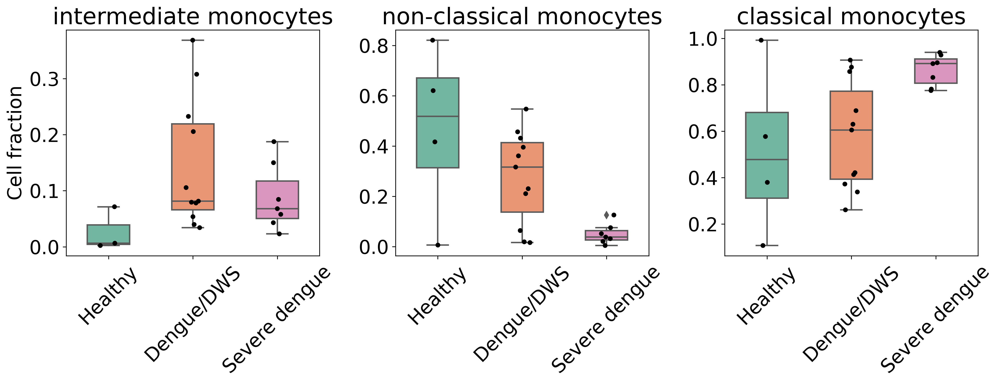

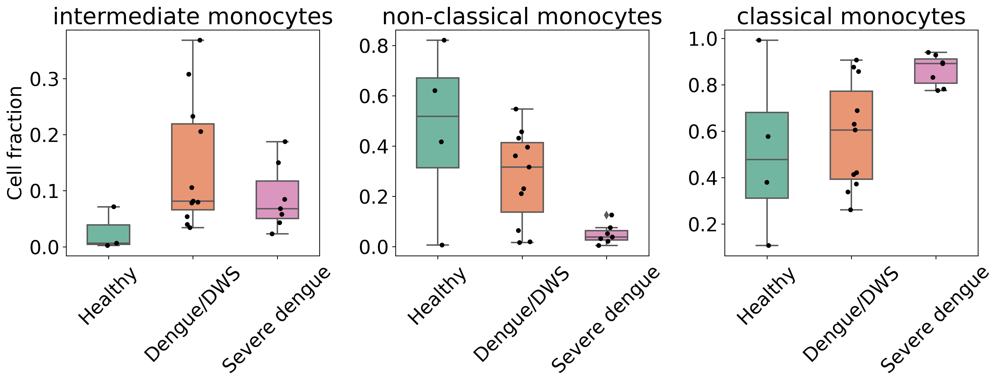

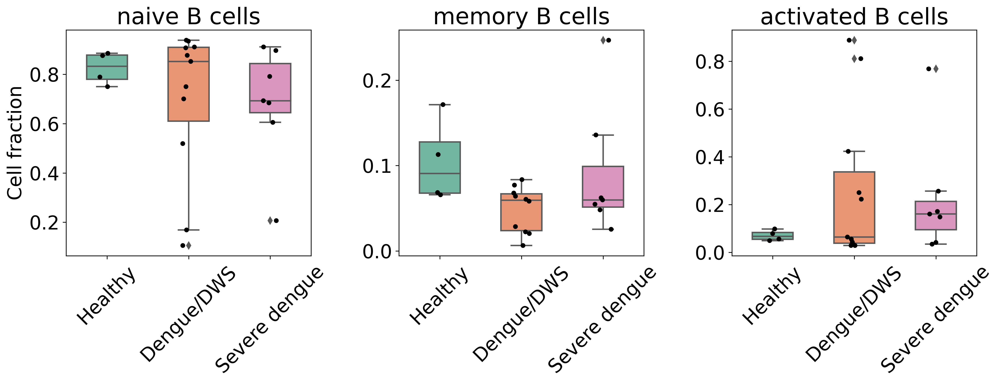

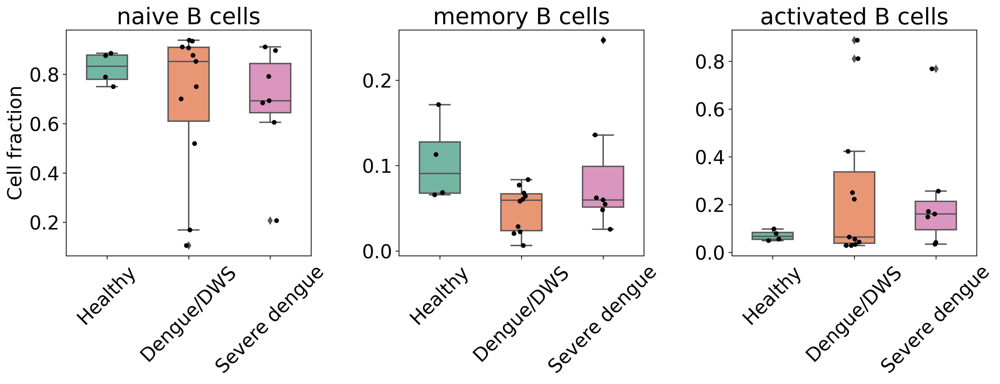

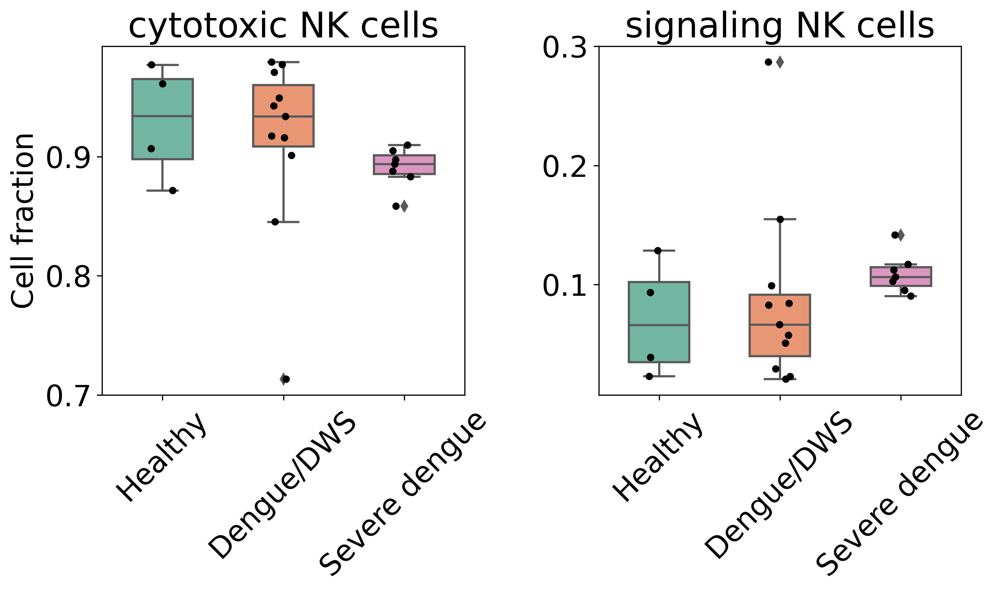

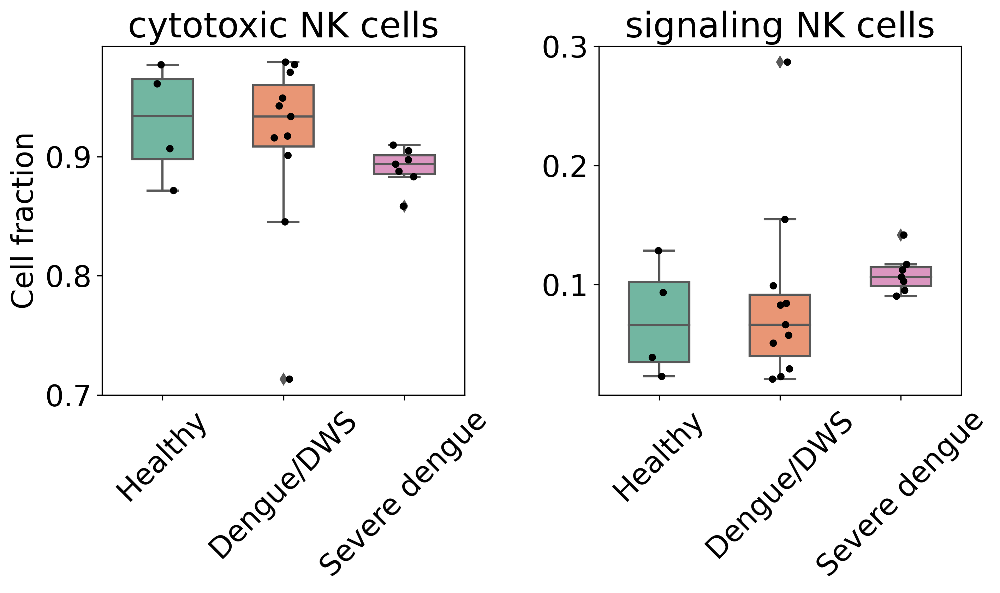

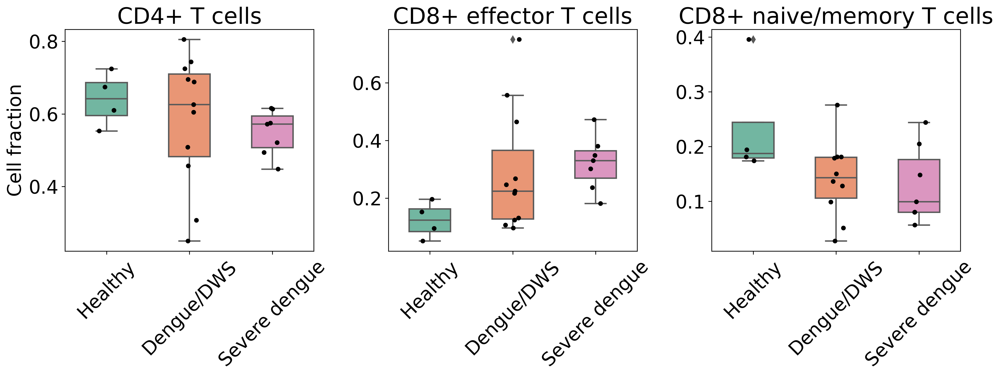

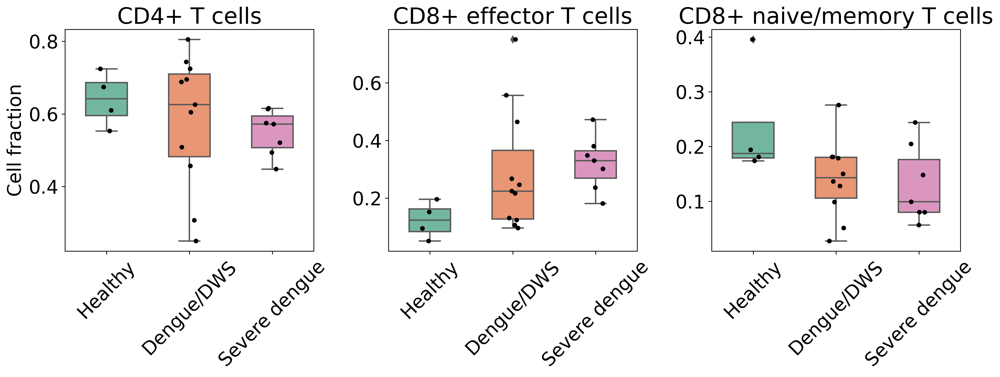

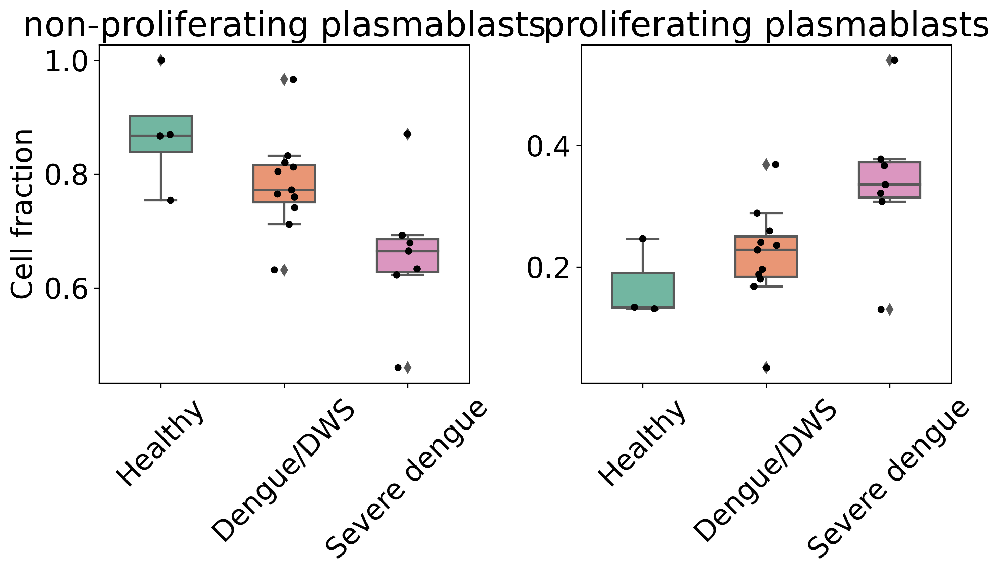

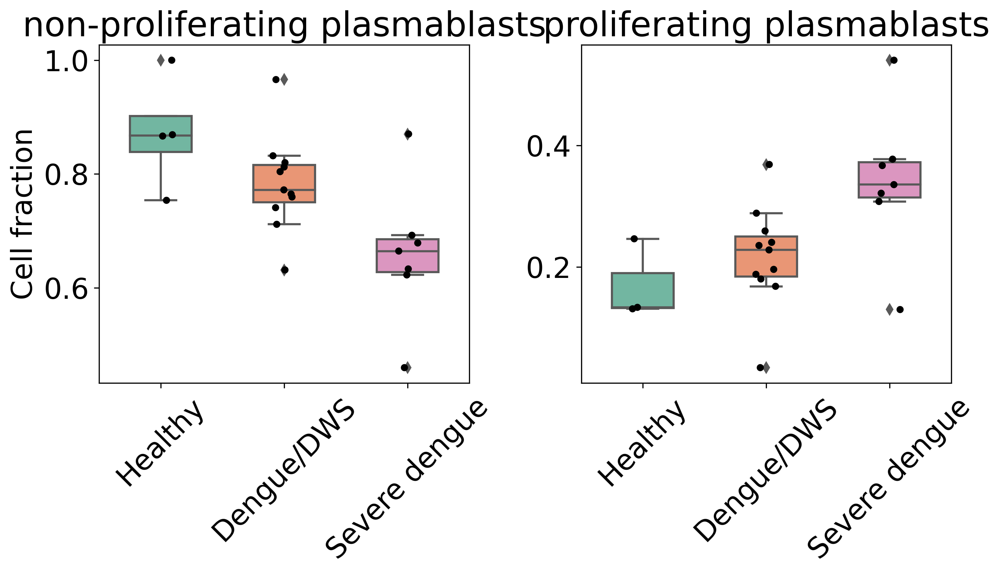

In [137]:
df_frac = frac_df(adata_kid)

# figure 3A -3C
for cell_type in ['Monocytes', 'B cells', 'NK cells', 'T cells', 'Plasmablasts']: 
    frac_barplot(adata_kid, cell_type, df_frac, save_figures, filetype='.pdf')
    frac_barplot(adata_kid, cell_type, df_frac, save_figures, filetype='.png')

/usr/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/usr/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


{'spearmanr (with healthy)': SpearmanrResult(correlation=-0.2485456192241588, pvalue=0.26470101551669845), 'pearsonr (with healthy)': (-0.23137921717803417, 0.3001740165634738), 'spearmanr (w/o healthy)': SpearmanrResult(correlation=-0.5245332102908308, pvalue=0.025430631910172218), 'pearsonr (w/o healthy)': (-0.5085783778231585, 0.031143315325172654)}


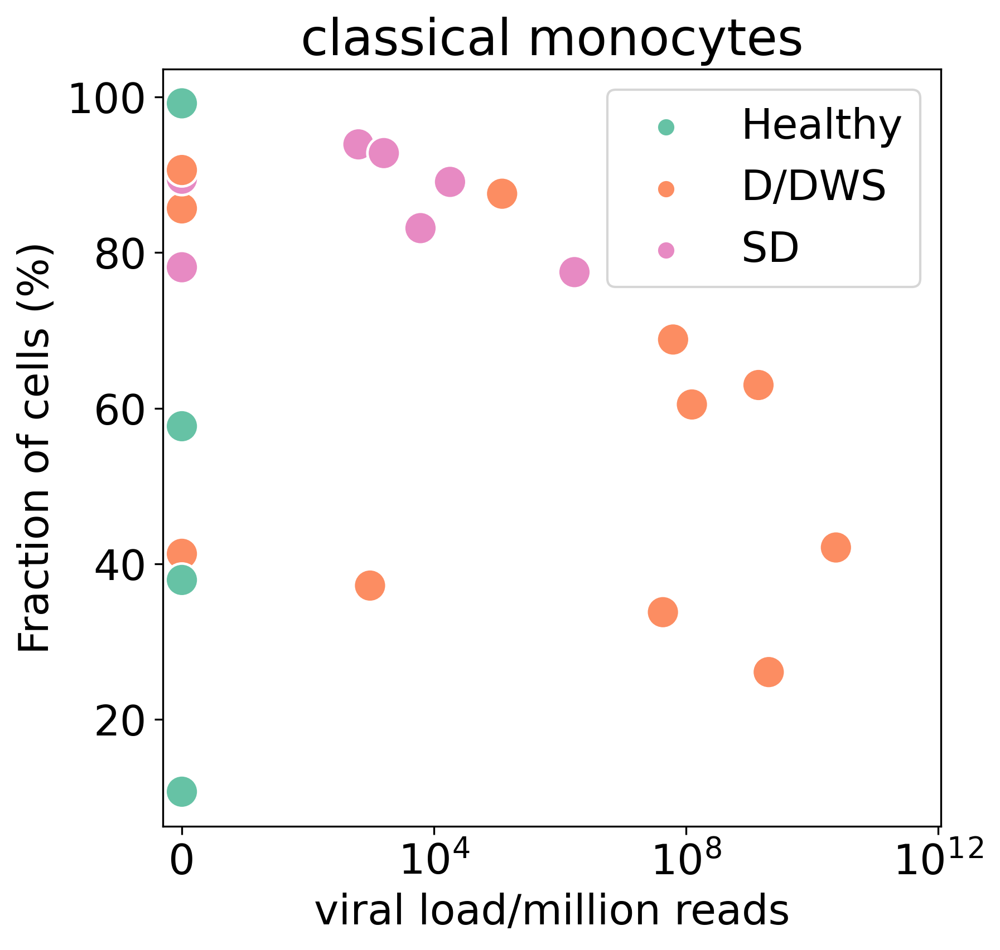

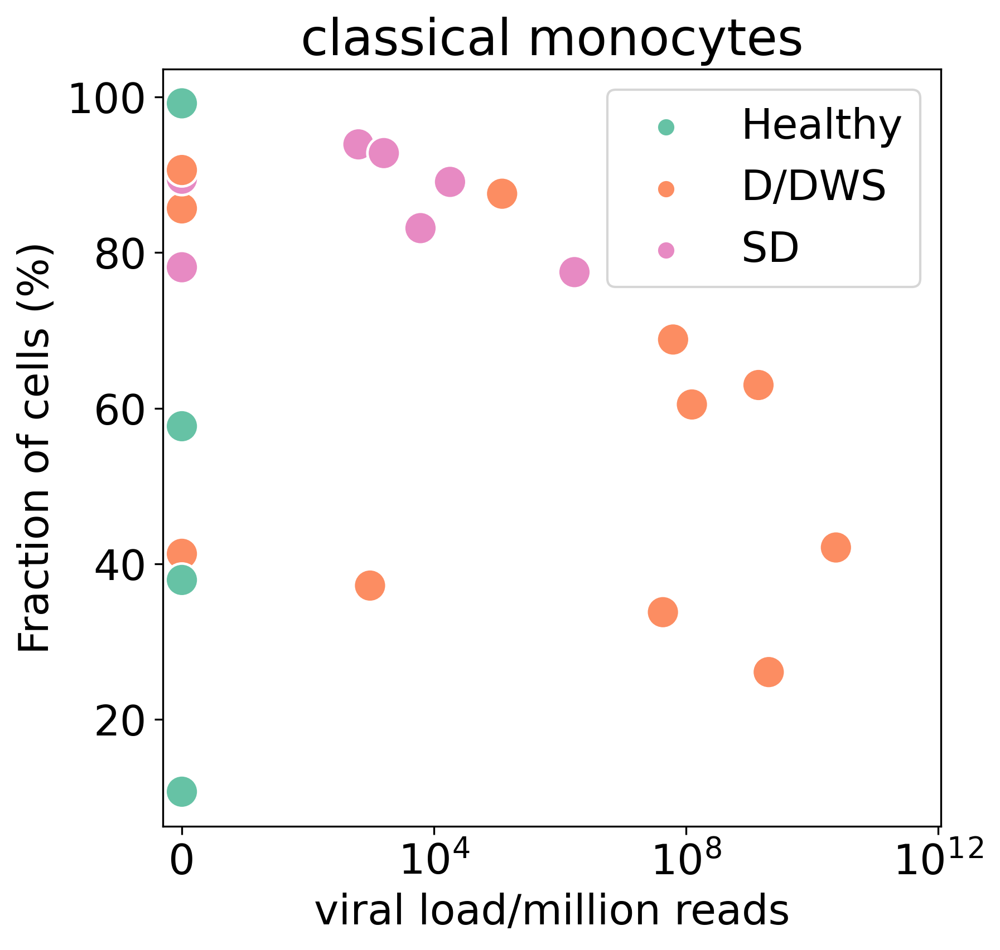

In [25]:
# figure 3D
cor_1 = viral_load_abundance(adata_kid, 'classical monocytes', save_figures, filetype='.png')
viral_load_abundance(adata_kid,  'classical monocytes', save_figures, filetype='.pdf')
print(cor_1)

/usr/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/usr/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


{'spearmanr (with healthy)': SpearmanrResult(correlation=-0.001754439665111709, pvalue=0.9938175151520967), 'pearsonr (with healthy)': (0.004322751314947068, 0.9847677331435397), 'spearmanr (w/o healthy)': SpearmanrResult(correlation=-0.1553786249171646, pvalue=0.5381272703286886), 'pearsonr (w/o healthy)': (-0.09084097633066349, 0.7199845772132373)}


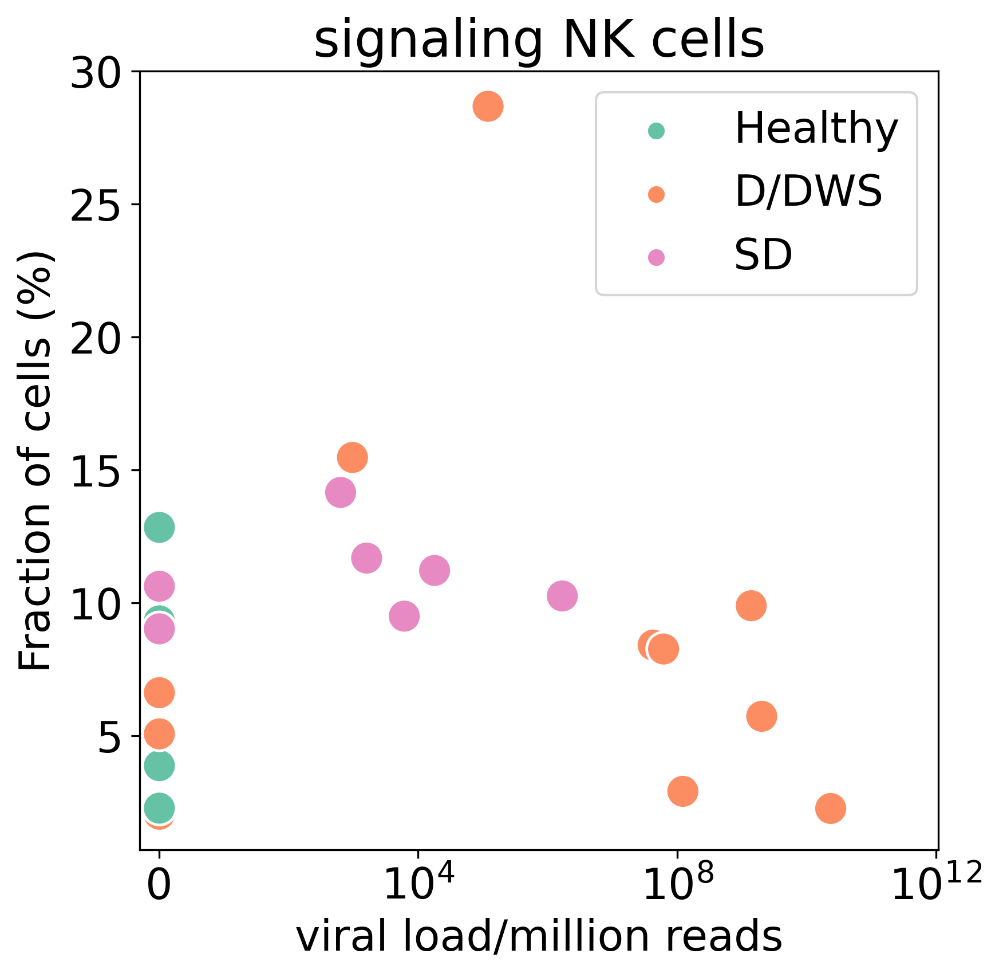

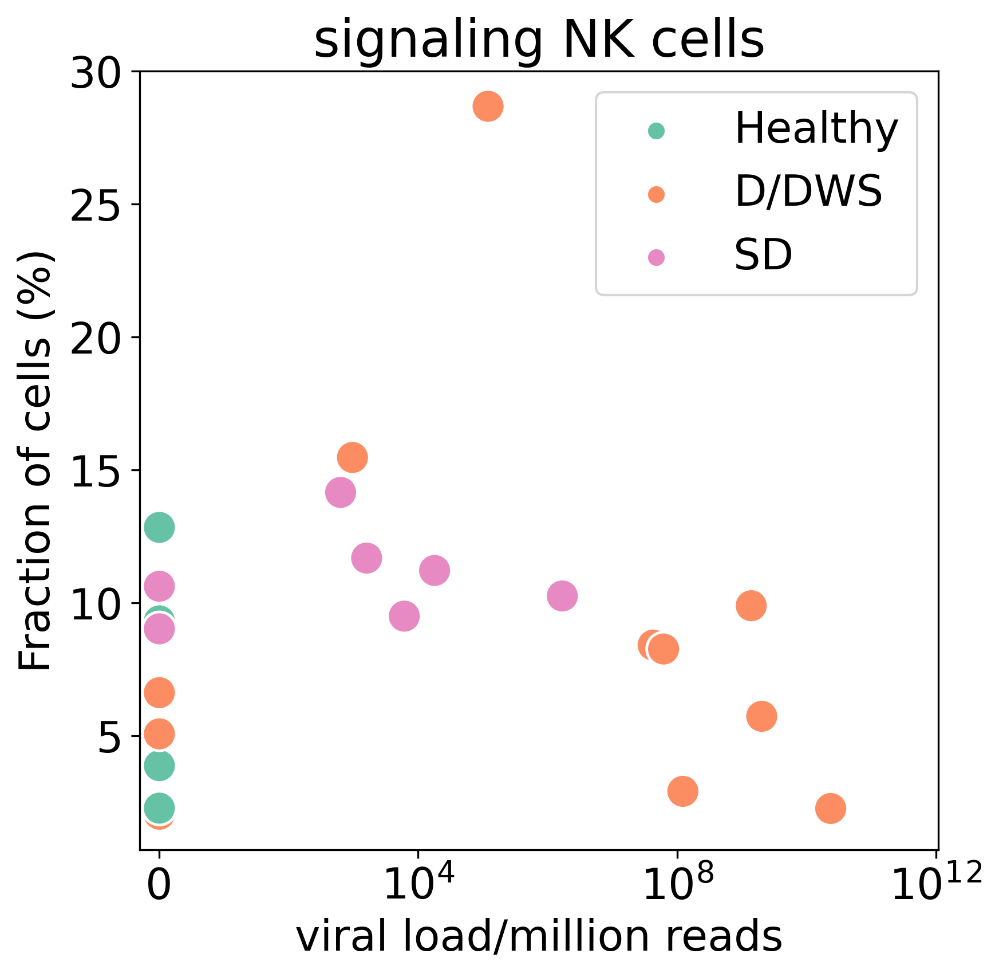

In [26]:
# figure 3#
cor_2 = viral_load_abundance(adata_kid, 'signaling NK cells', save_figures, filetype='.png')
viral_load_abundance(adata_kid, 'signaling NK cells', save_figures, filetype='.pdf')
print(cor_2)

/usr/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/usr/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


{'spearmanr (with healthy)': SpearmanrResult(correlation=0.3783741544424252, pvalue=0.08249894265048521), 'pearsonr (with healthy)': (0.33372275248944316, 0.12905755477504502), 'spearmanr (w/o healthy)': SpearmanrResult(correlation=0.20126224569807227, pvalue=0.42323154917539196), 'pearsonr (w/o healthy)': (0.16654430683753818, 0.5089342009354615)}


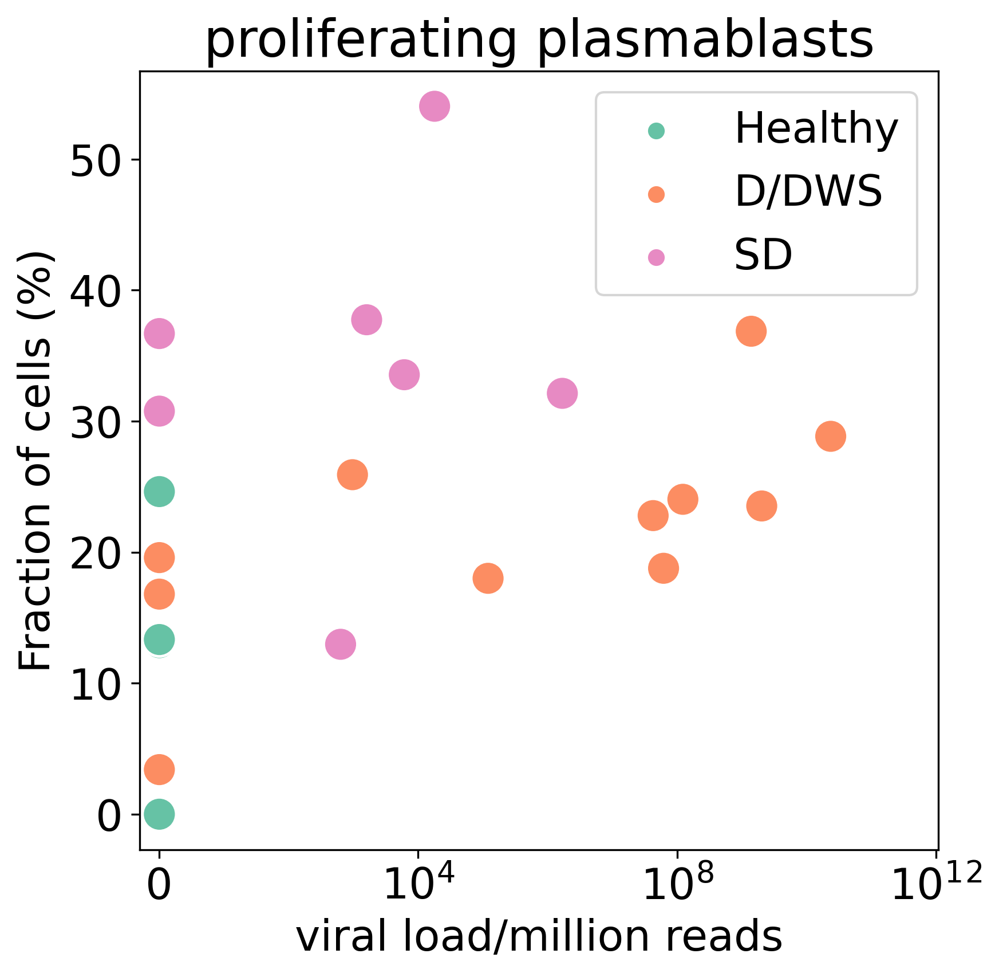

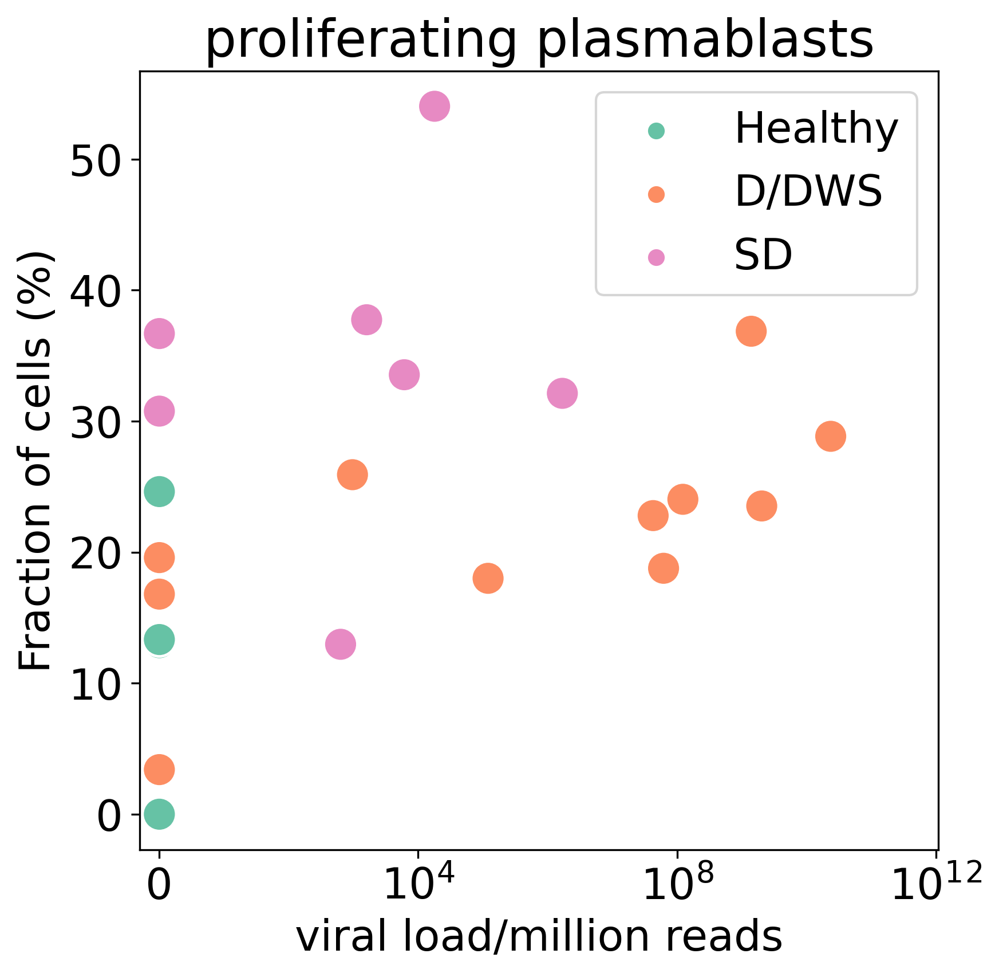

In [27]:
# figure 3F
cor_3 = viral_load_abundance(adata_kid, 'proliferating plasmablasts', save_figures, filetype='.png')
viral_load_abundance(adata_kid, 'proliferating plasmablasts', save_figures, filetype='.pdf')
print(cor_3)

In [88]:
# for figure 3G, H
#load data

adata_adult = subsetdata(adata, platform ='plate')
adata_adult = normalizedata(adata_adult)
adata_adult = removegenes(adata_adult)

/usr/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [89]:
adata_adult_NK = adata_adult[adata_adult.obs['cell_type'] == 'NK_cells']

sc.pp.pca(adata_adult_NK, n_comps=40, svd_solver='arpack')
sc.pp.neighbors(adata_adult_NK, n_pcs = 15)
sc.tl.umap(adata_adult_NK)
sc.tl.leiden(adata_adult_NK, resolution=0.3, key_added = 'leiden_r0.3')

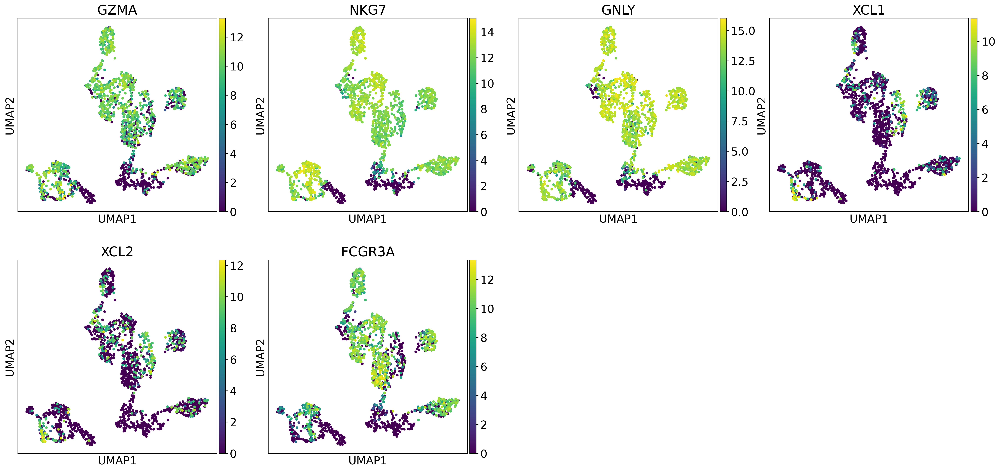

In [18]:
marker_genes_NK = ['GZMA',  'NKG7', 'GNLY', 'XCL1', 'XCL2', 'FCGR3A']
sc.pl.umap(adata_adult_NK, color=marker_genes_NK)


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


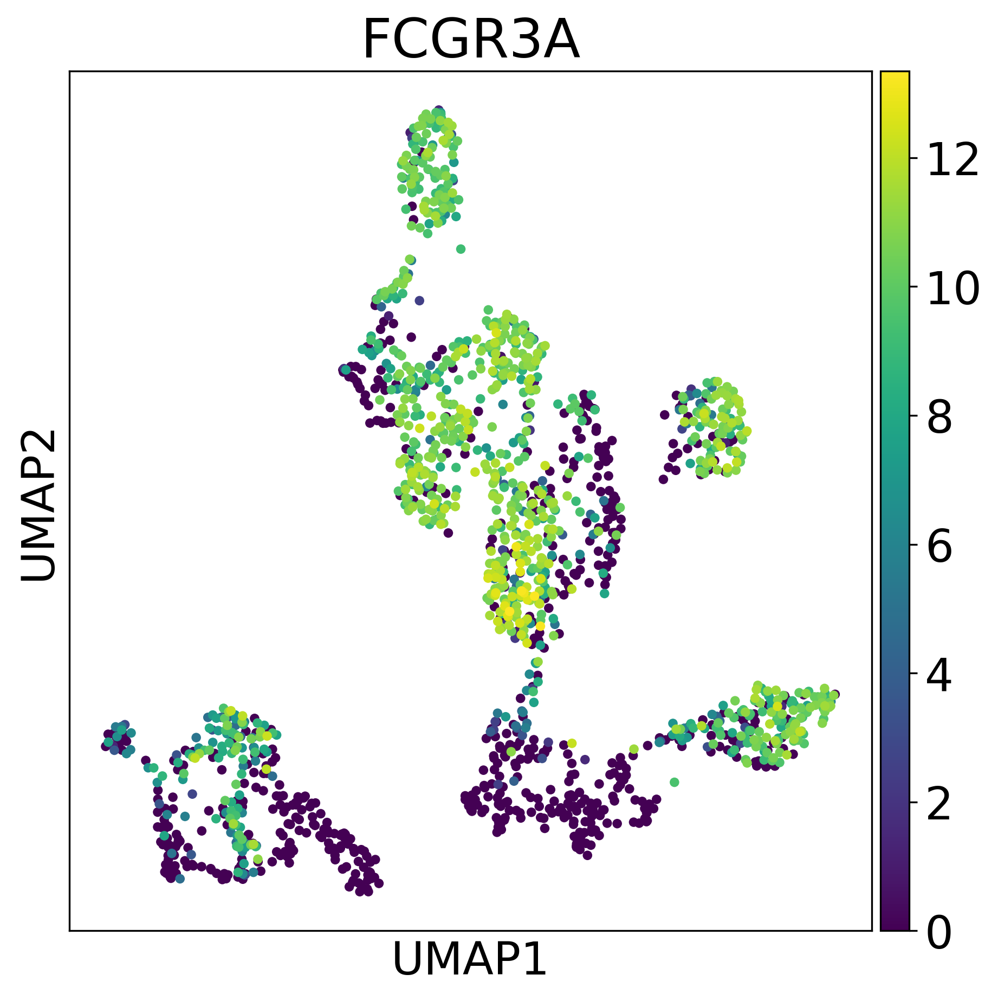

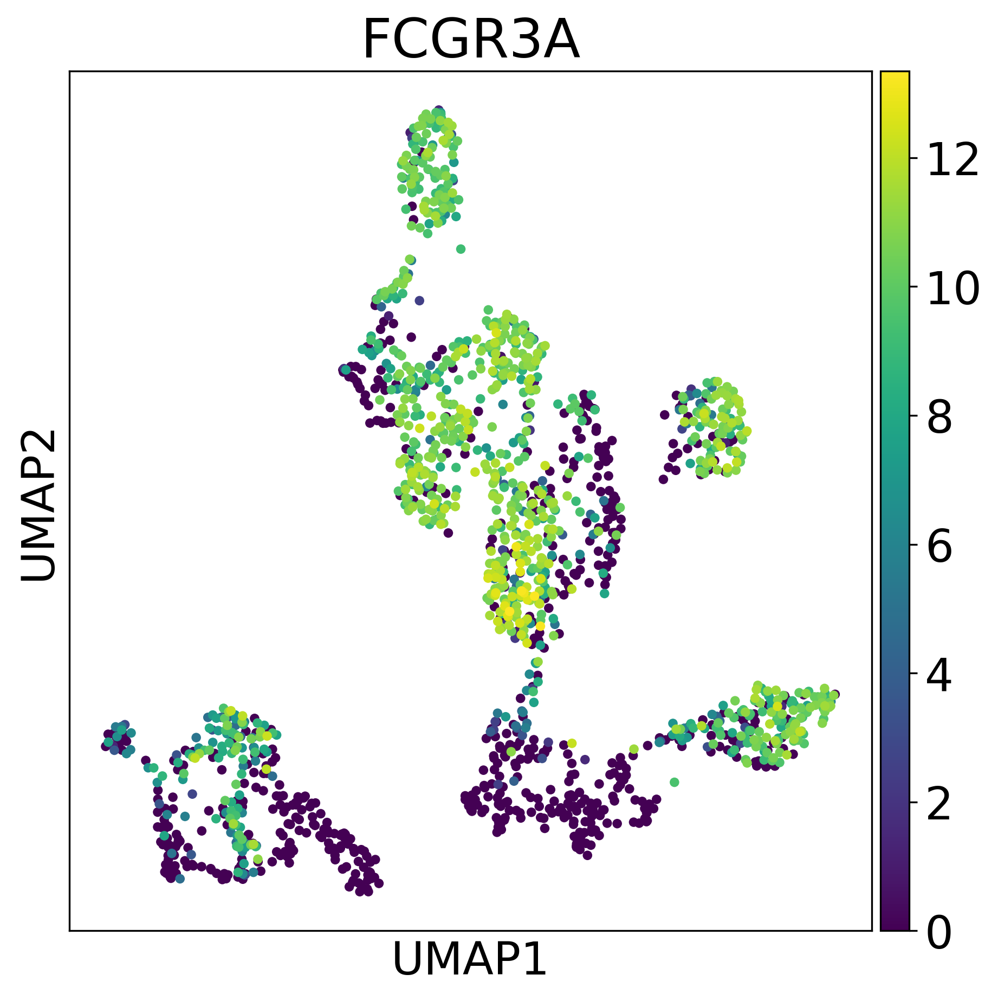

In [90]:
marker_genes_NK = ['GZMA',  'NKG7', 'GNLY', 'XCL1', 'XCL2', 'FCGR3A']

for gene in marker_genes_NK:
    umap_marker(adata_adult_NK, gene, 'NK', save_figures + 'adults/', filetype='.pdf')
    umap_marker(adata_adult_NK, gene, 'NK', save_figures + 'adults/', filetype='.png')

In [19]:
adata_adult_P = adata_adult[adata_adult.obs['cell_type'] == 'Plasmablasts']

sc.pp.pca(adata_adult_P, n_comps=40, svd_solver='arpack')
sc.pp.neighbors(adata_adult_P, n_pcs = 15)
sc.tl.umap(adata_adult_P)
sc.tl.leiden(adata_adult_P, resolution=0.3, key_added = 'leiden_r0.3')

/usr/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


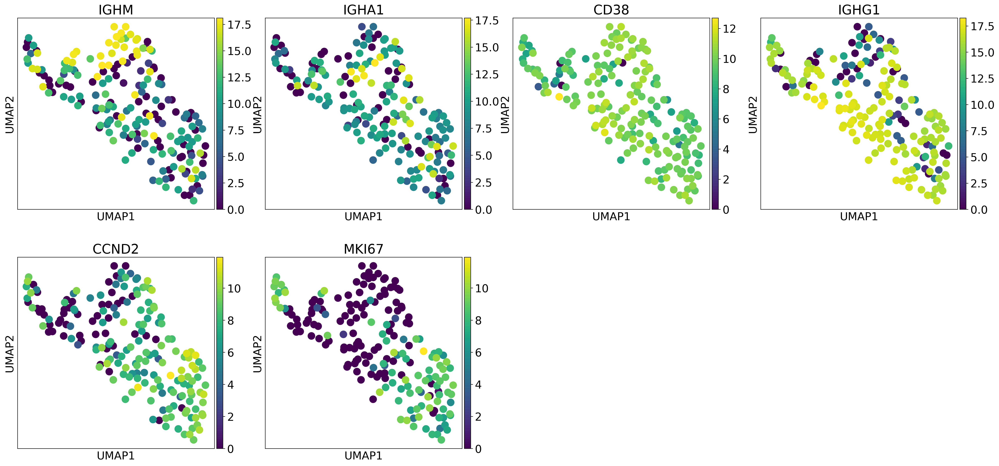

In [21]:
marker_genes_P = ['IGHM', 'IGHA1', 'CD38', 'IGHG1', 'CCND2', 'MKI67']
sc.pl.umap(adata_adult_P, color=marker_genes_P)

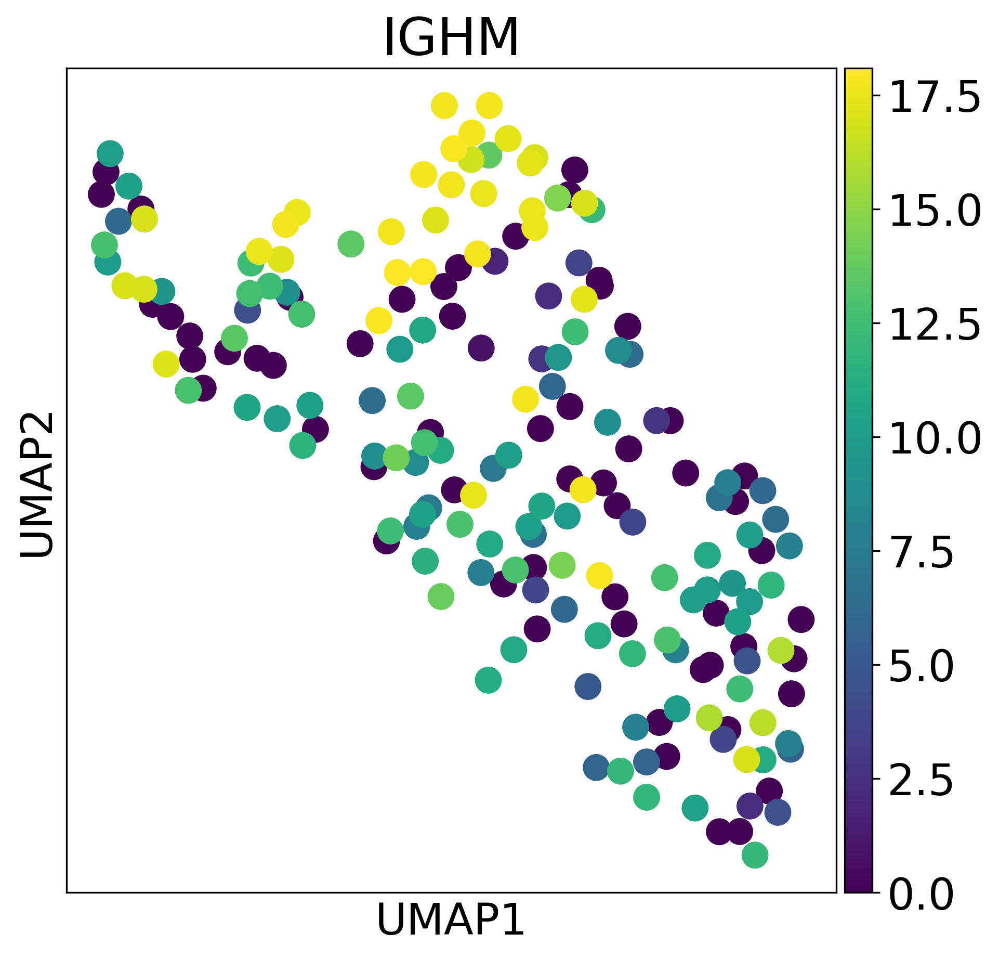

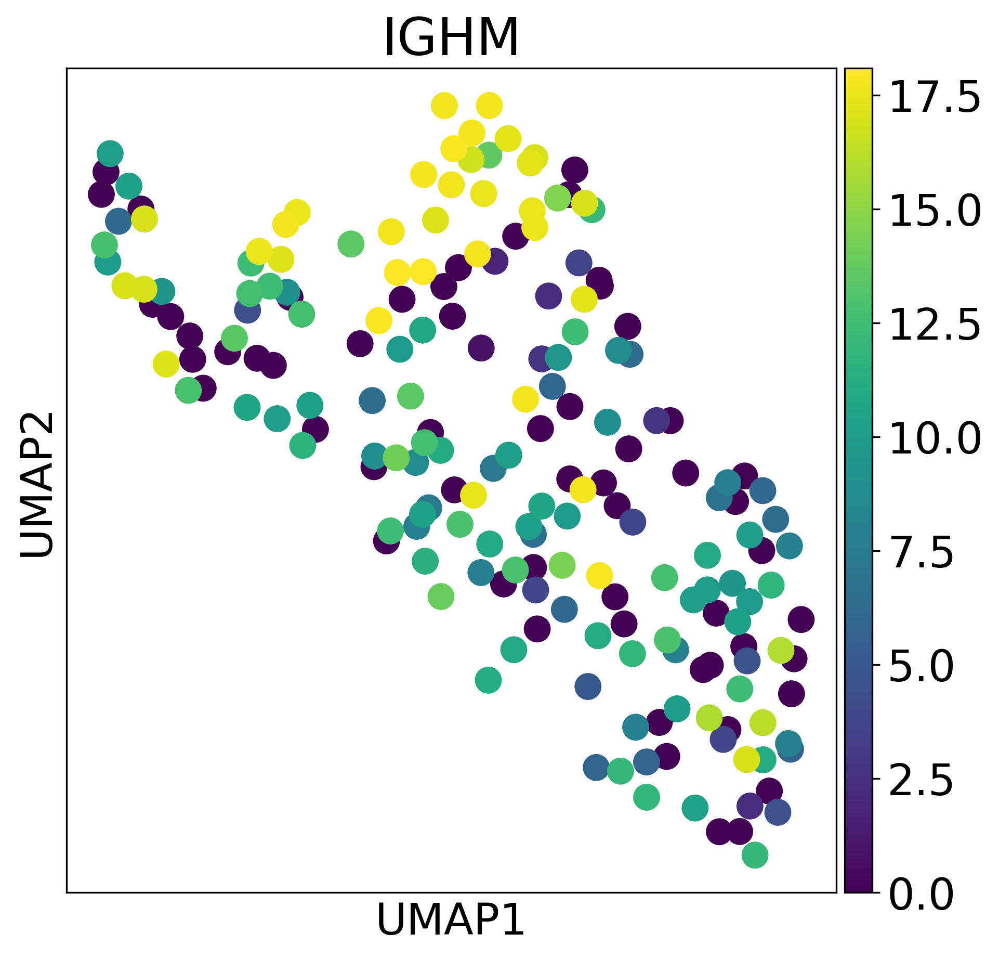

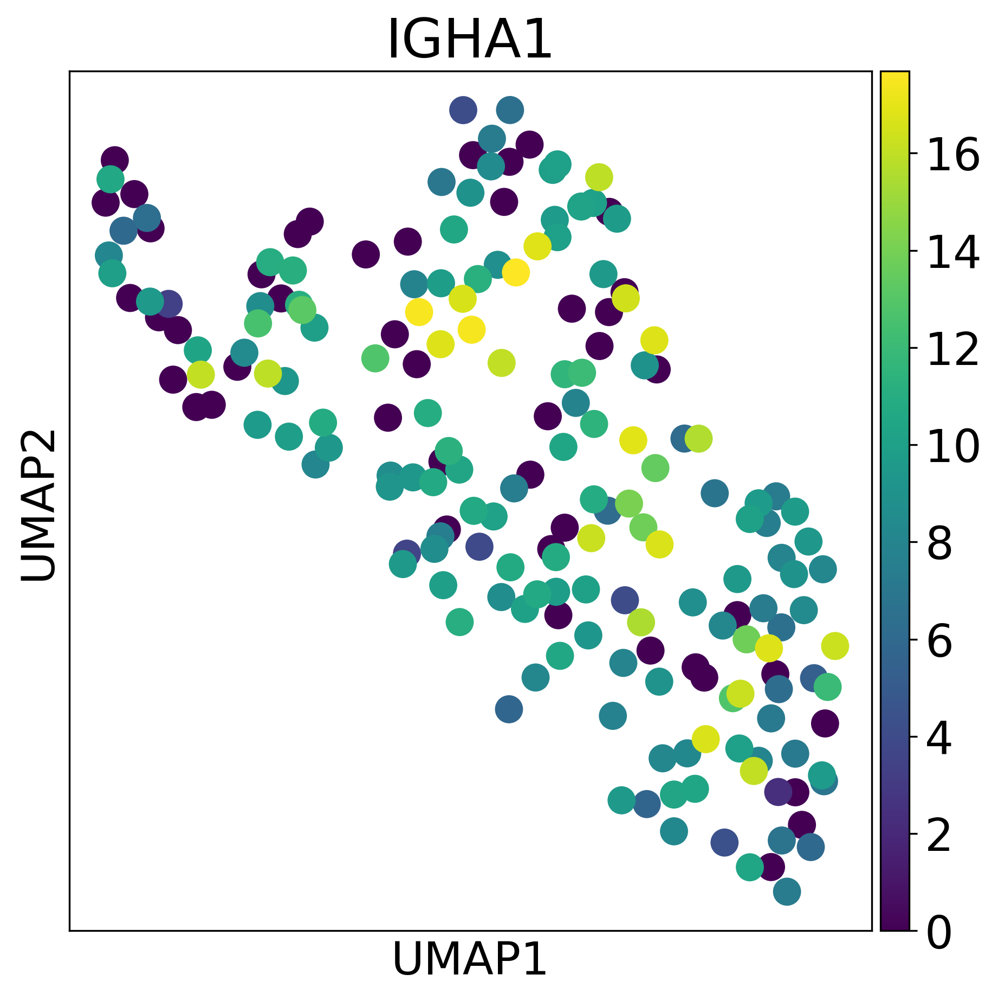

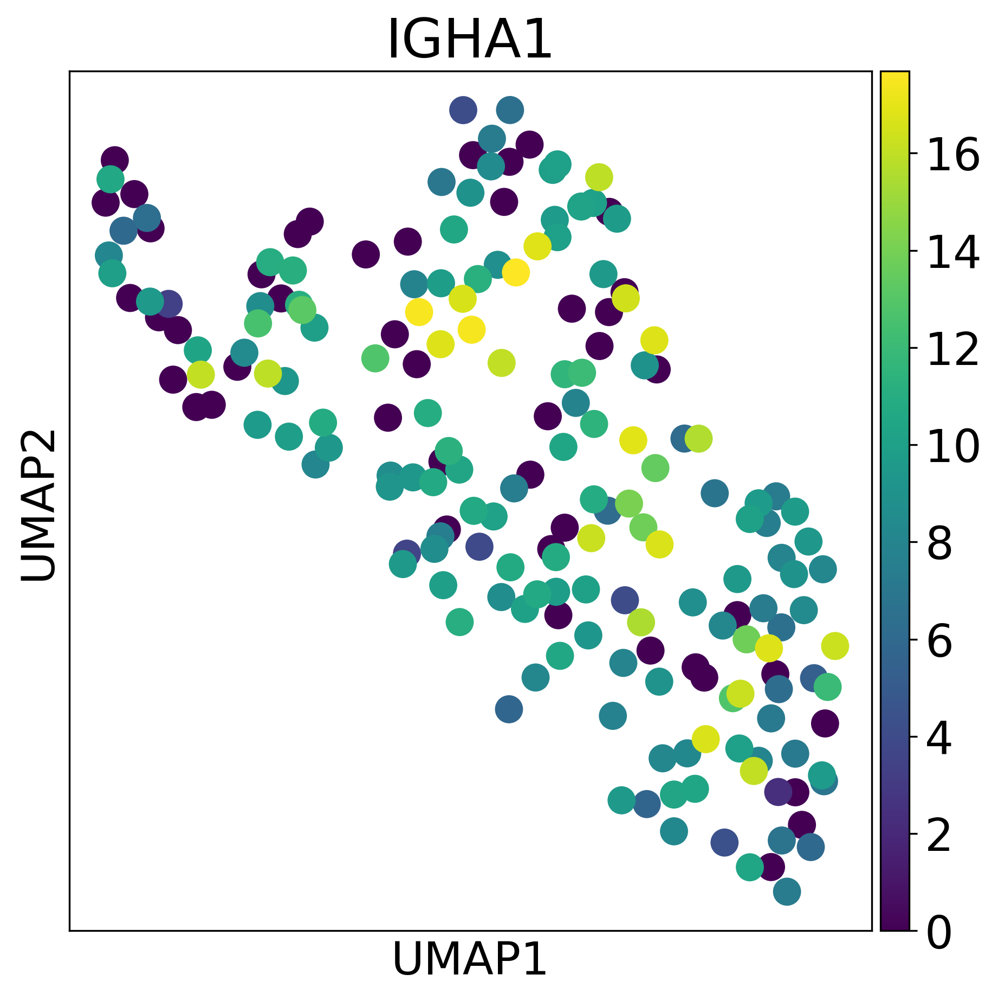

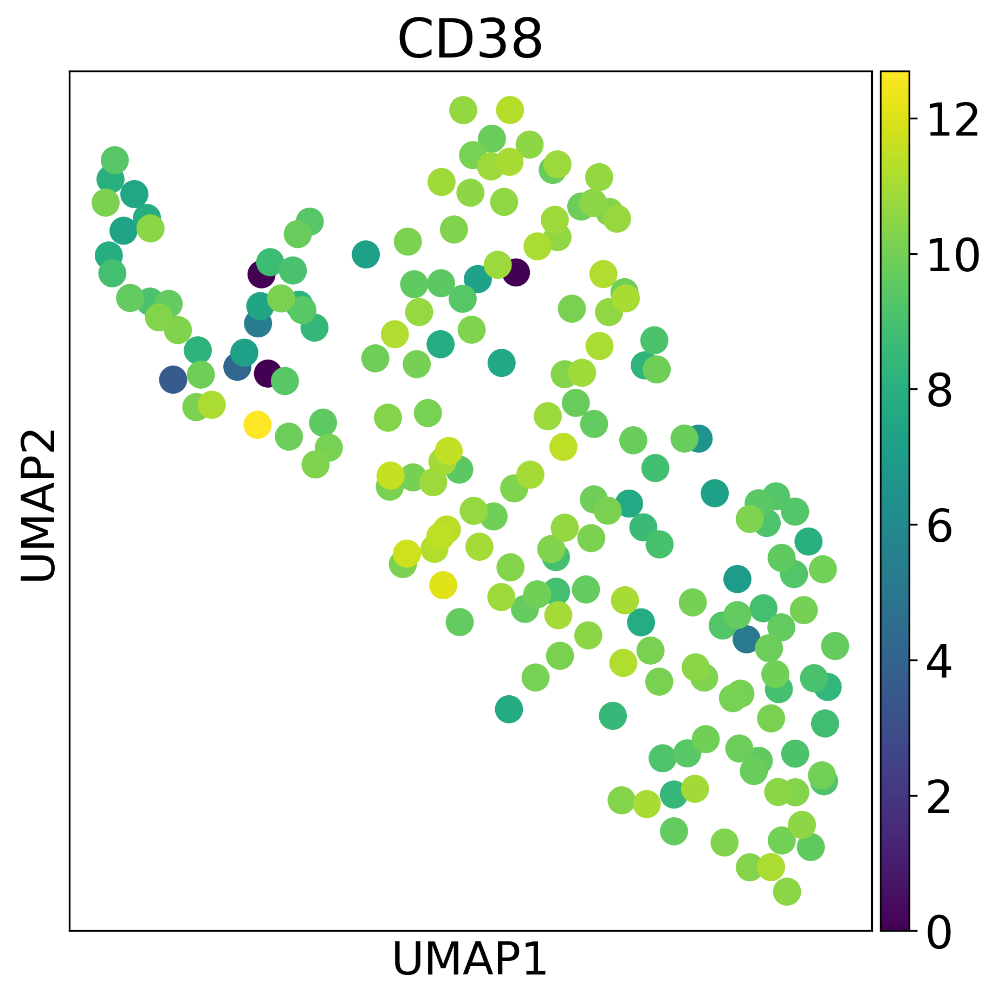

...

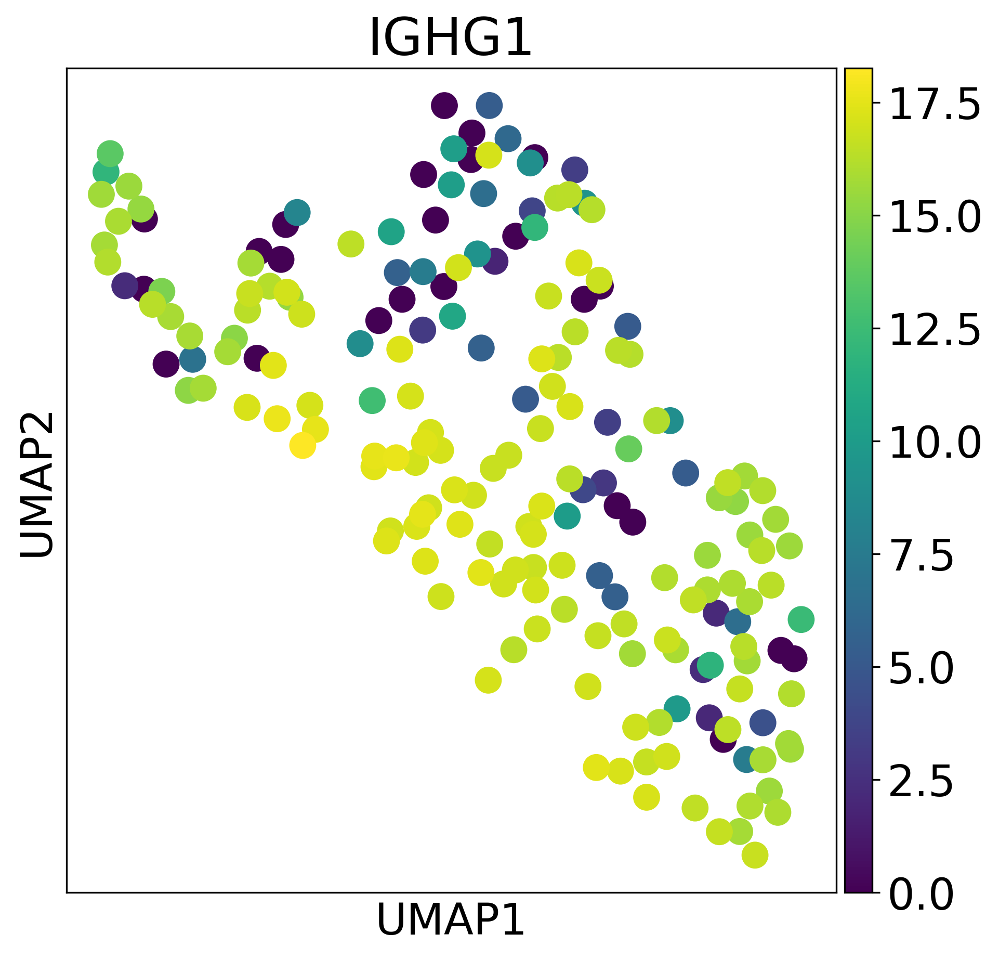

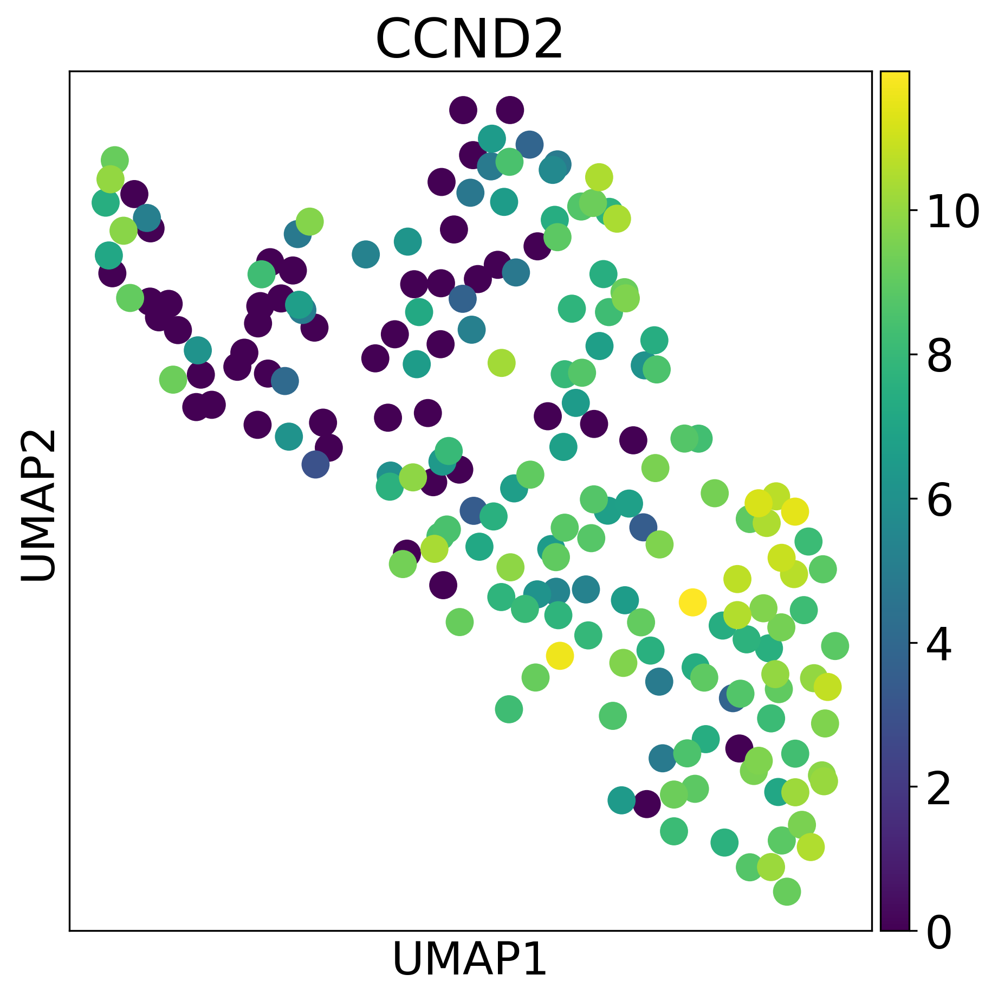

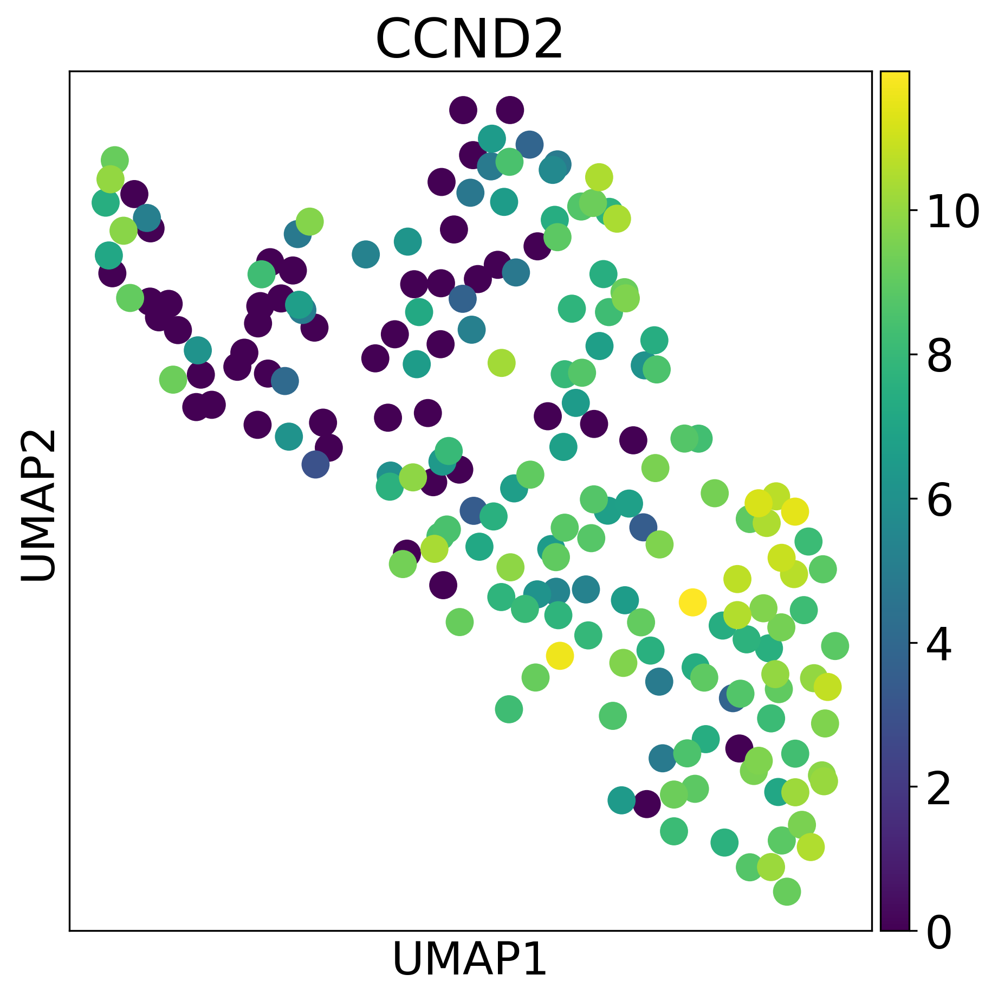

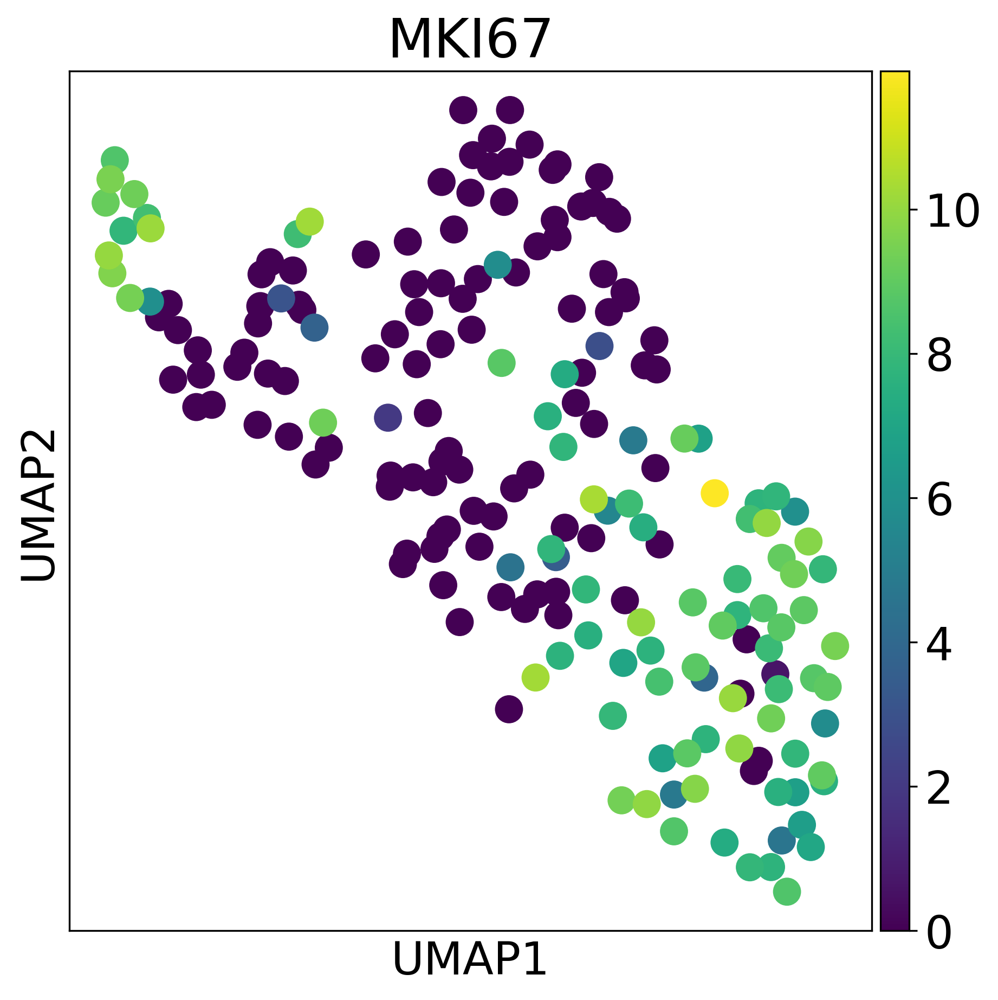

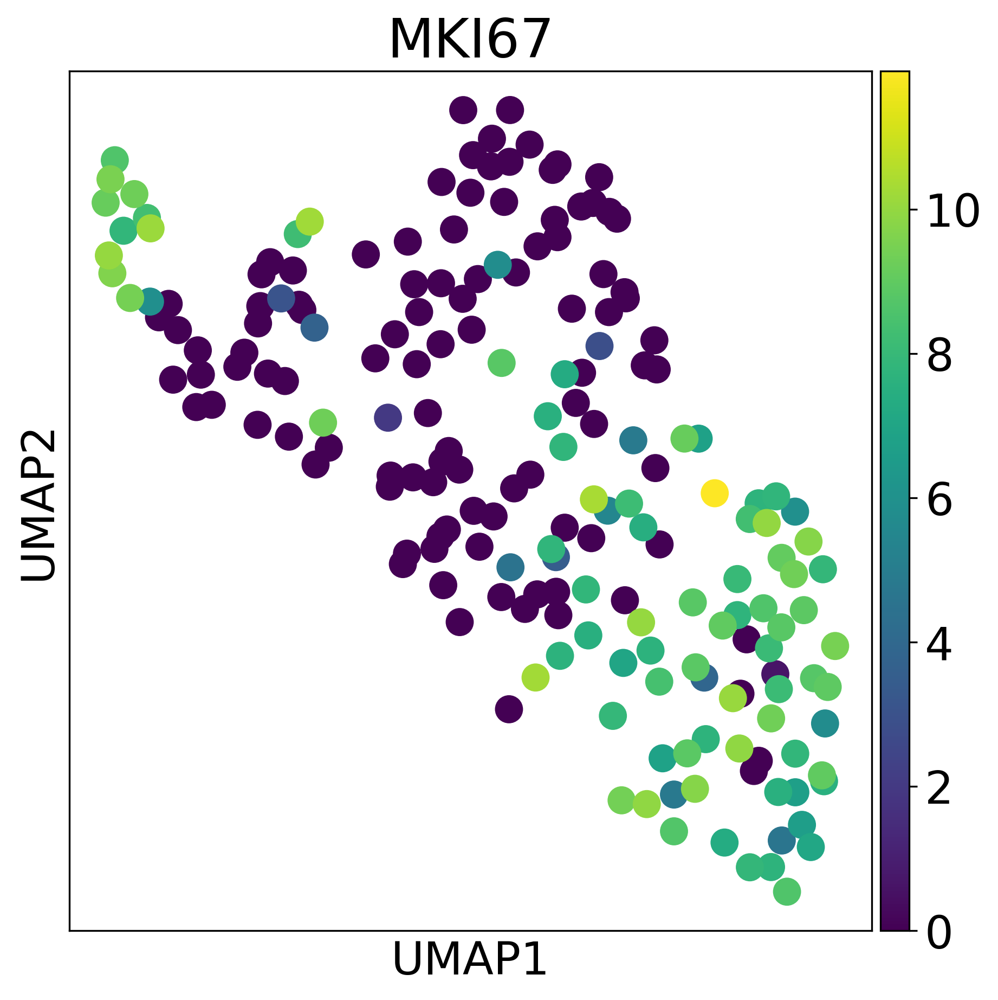

In [136]:
marker_genes_P = ['IGHM', 'IGHA1', 'CD38', 'IGHG1', 'CCND2', 'MKI67']

for gene in marker_genes_P:
    umap_marker(adata_adult_P, gene, 'P', save_figures + 'adults/', filetype='.pdf')
    umap_marker(adata_adult_P, gene, 'P', save_figures + 'adults/', filetype='.png')

In [92]:
adata_temp = annanote_adult(adata_adult)
df_frac_a = frac_df(adata_temp)

# figure 3A -3C
# for cell_type in ['NK cells', 'Plasmablasts']:
#     frac_barplot(adata_temp, cell_type, df_frac_a, save_figures + 'adults/', filetype='.pdf')
#     frac_barplot(adata_temp, cell_type, df_frac_a, save_figures + 'adults/', filetype='.png')

/usr/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/usr/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


/usr/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/usr/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/usr/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/usr/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


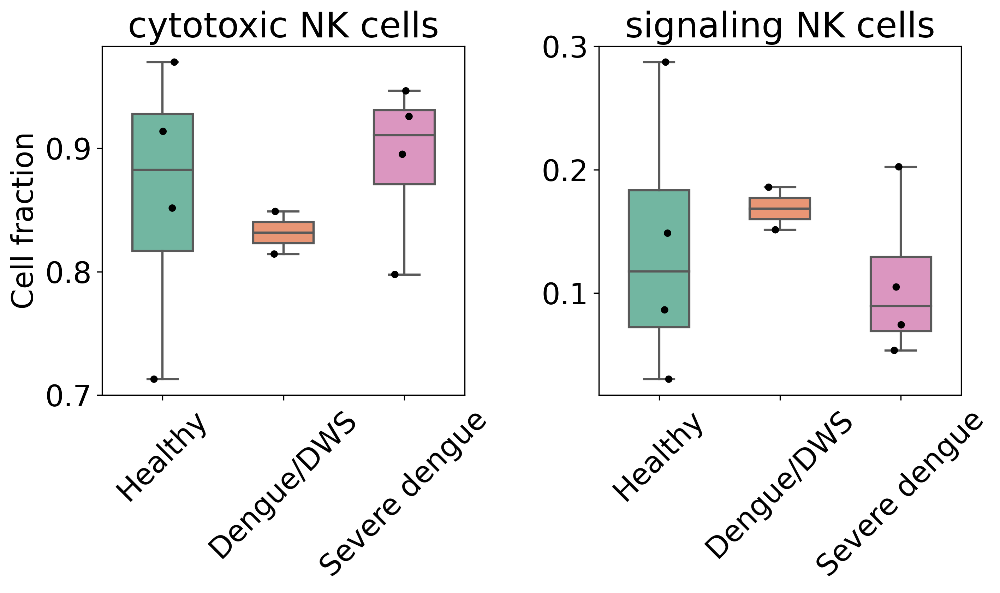

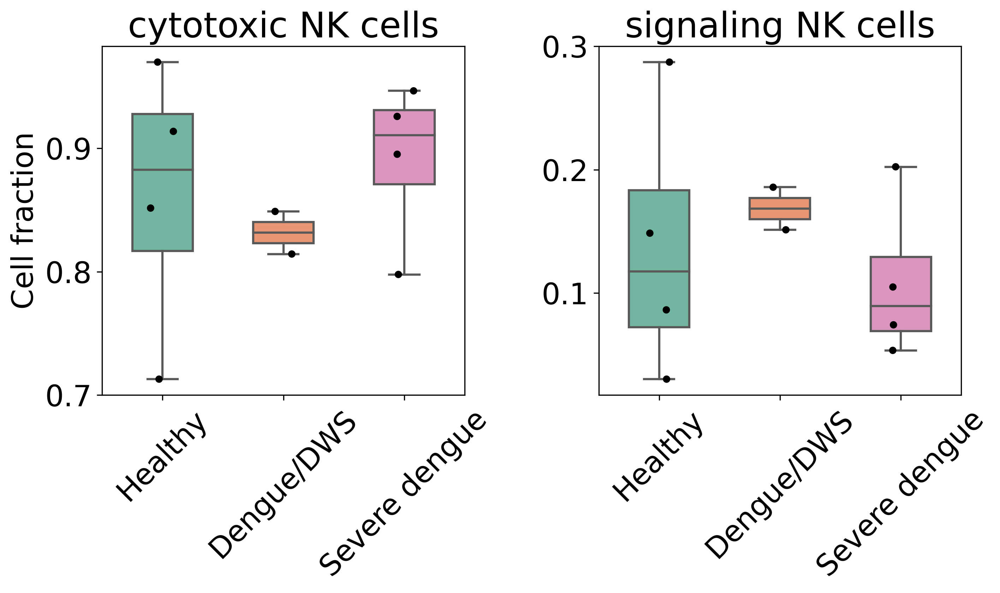

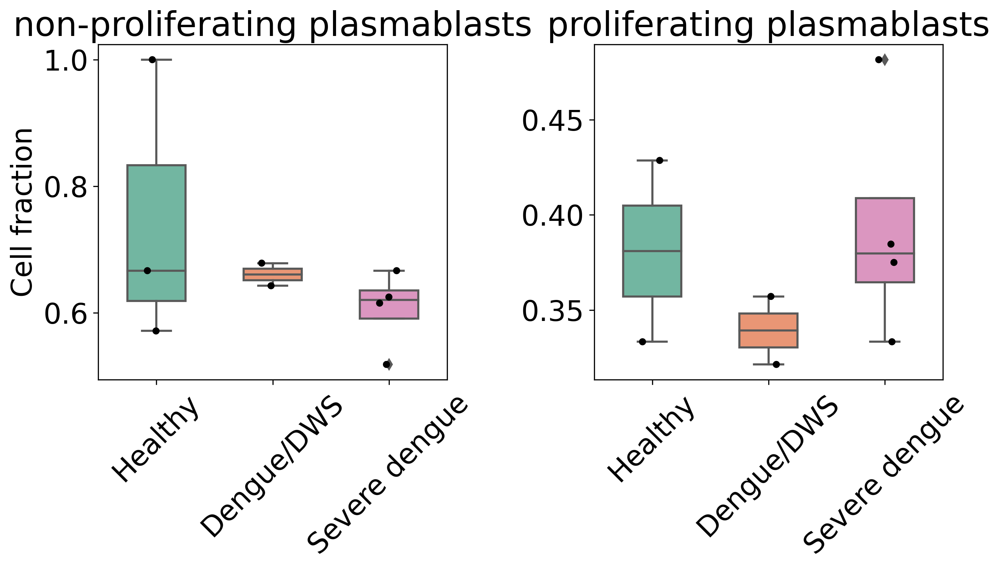

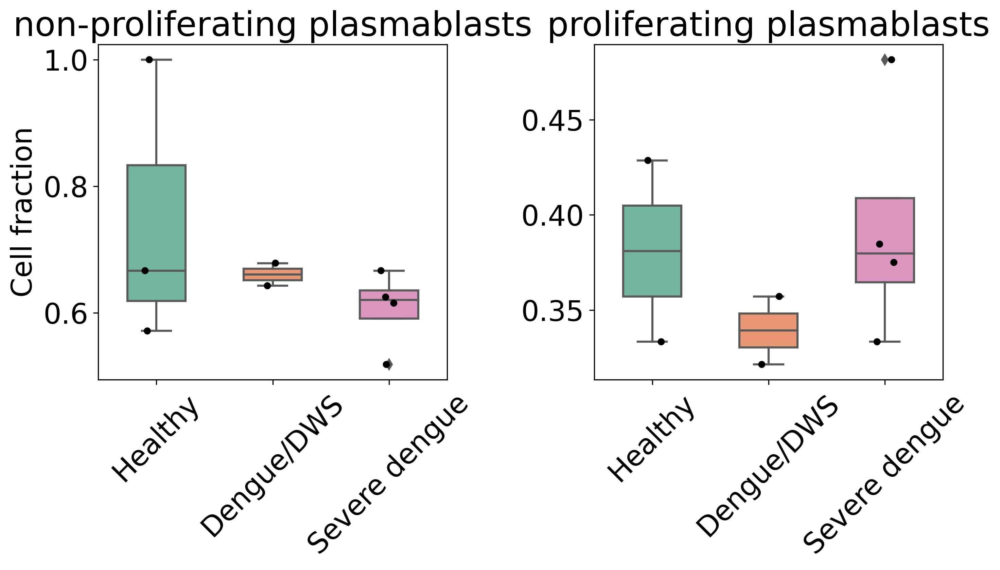

In [94]:
for cell_type in ['NK cells', 'Plasmablasts']:
    frac_barplot(adata_temp, cell_type, df_frac_a, save_figures + 'adults/', filetype='.pdf')
    frac_barplot(adata_temp, cell_type, df_frac_a, save_figures + 'adults/', filetype='.png')

In [47]:
ct_pair = pd.read_csv(save_tables + 'ct_pair.tsv', sep='\t', index_col=['cell_subtype', 'gene'])
ct_log2FC = pd.read_csv(save_tables + 'ct_log2FC.tsv', sep='\t', index_col=0)

cst_pair = pd.read_csv(save_tables + 'cst_pair.tsv', sep='\t', index_col=['cell_subtype', 'gene'])
cst_log2FC = pd.read_csv(save_tables + 'cst_log2FC.tsv', sep='\t', index_col=0)

In [46]:
print('perform FDR ( Benjamini/Hochberg) correction to p-values')

from statsmodels.stats.multitest import multipletests

if False:
    ct_data = pd.DataFrame([])
    for cell_type in cell_types:
        data_ct = ct_pair.loc[cell_type]
        adjust_pvalue = multipletests(data_ct['pvalue'], alpha=0.05, method='fdr_bh')[1] # pvals_corrected
        data_ct['pvalue_corrected'] = adjust_pvalue
        data_ct['cell_subtype'] = cell_type
        data_ct.reset_index(inplace=True)
        ct_data = pd.concat([ct_data, data_ct])
    ct_data.to_csv(save_tables + 'ct_pair.tsv', sep='\t', index=False)

    cst_data = pd.DataFrame([])
    for cell_subtype in cell_subtypes:
        data_cst = cst_pair.loc[cell_subtype]
        adjust_pvalue = multipletests(data_cst['pvalue'], alpha=0.05, method='fdr_bh')[1] # pvals_corrected
        data_cst['pvalue_corrected'] = adjust_pvalue
        data_cst['cell_subtype'] = cell_subtype
        data_cst.reset_index(inplace=True)
        cst_data = pd.concat([cst_data, data_cst])
    cst_data.to_csv(save_tables + 'cst_pair.tsv', sep='\t', index=False)

perform FDR ( Benjamini/Hochberg) correction to p-values


<ipython-input-46-4b1f9f5837b8>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_ct['pvalue_corrected'] = adjust_pvalue
<ipython-input-46-4b1f9f5837b8>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_ct['cell_subtype'] = cell_type
<ipython-input-46-4b1f9f5837b8>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

In [48]:
DEG_idx = (((ct_pair['log2_fold_change'] >= 1) | (ct_pair['log2_fold_change'] <= -1)) 
            & (ct_pair['pvalue_corrected'] <= 0.05))
DEGs = ct_pair.loc[DEG_idx]
DEGs.to_csv(save_tables + 'DEGs.tsv', sep='\t')

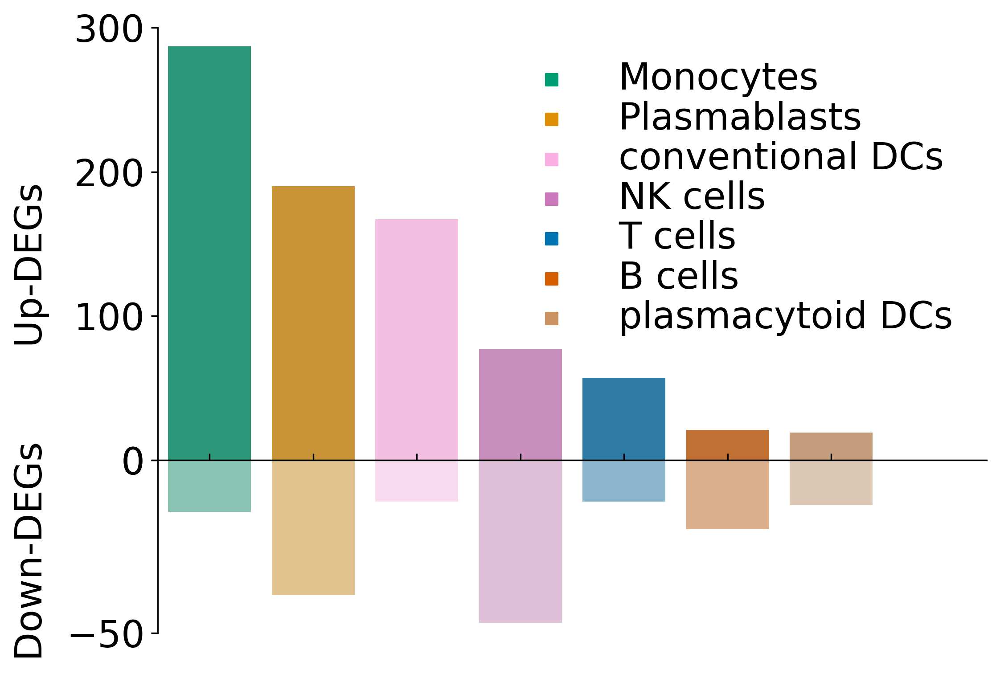

In [53]:
n = []
for ct in cell_types[: -1]:
    data_ct = ct_pair.loc[ct]
    up_n = ((data_ct['log2_fold_change'] >= 1) & (data_ct['pvalue_corrected'] <= 0.05)).sum()
    down_n = ((data_ct['log2_fold_change'] <= -1) & (data_ct['pvalue_corrected'] <= 0.05)).sum()
    n_ct = up_n + down_n
    n.append([ct, up_n, -down_n, n_ct])

n = pd.DataFrame(n, columns=['cell_type', 
                             'Number of upregulated DEGs', 
                             'Number of downregulated DEGs',
                             'Number of DEGs'])

################################################################
rcParams['font.size']= 20
rcParams['pdf.fonttype'] = 42
rcParams['figure.dpi'] = 300
rcParams['font.sans-serif'] = "Arial"

fig, axs = plt.subplots(2, 1, figsize=[8, 6])

grid = plt.GridSpec(7, 1)
axs[0] = plt.subplot(grid[:5, :1])
axs[1] = plt.subplot(grid[5:7, :1])

plt.subplots_adjust(hspace=0)

n = n.sort_values('Number of DEGs', ascending=False)
order = n['cell_type']
cmap = [ct_palette[ct] for ct in order]

sns.barplot(data=n, x='cell_type', y='Number of upregulated DEGs', palette=cmap, ax=axs[0], alpha=0.9) # orient='h',
axs[0].set_xticklabels([])
axs[0].set_xlabel(None)
axs[0].set_ylabel(None)
axs[0].set_ylim(0, 300)
axs[0].set_xlim(-0.5, 7.5)
axs[0].set_yticks(range(0, 301, 100))
axs[0].spines['right'].set_visible(False)
axs[0].spines['top'].set_visible(False)
sns.barplot(data=n, x='cell_type', y='Number of downregulated DEGs', palette=cmap, ax=axs[1], alpha=0.5) # orient='h',
axs[1].xaxis.tick_top()
axs[1].set_xlim(-0.5, 7.5)
axs[1].set_xticklabels([])
axs[1].set_xlabel(None)
axs[1].set_ylabel(None)
axs[1].set_ylim(-50, 0)
axs[1].set_yticks([-50, 0])
axs[1].spines['right'].set_visible(False)
axs[1].spines['bottom'].set_visible(False)

fig.text(-0.01, 0.1, 'Down-DEGs        Up-DEGs',verticalalignment='baseline', horizontalalignment='left',
            rotation=90)

handles = []
labels = []
for ct, color in zip(order, cmap):
    h = axs[0].scatter([], [], marker='s', s=40, color=color,)
    handles.append(h)
    labels.append(ct)
axs[0].legend(handles, labels, loc='upper right', frameon=False, labelspacing=0.1)#
fig.savefig(save_figures + 'ct_DEGs_2.png',bbox_inches='tight')
fig.savefig(save_figures + 'ct_DEGs_2.pdf',bbox_inches='tight')

In [ ]:
def P_B_frac(adata):     
    temp = adata[(adata.obs['cell_subtype_new'] != 'unknown') & (adata.obs['cell_subtype_new'] != 'doublets')].copy()
    # exclude samples with second filters and with too many bystanders
    temp = temp[ ~ temp.obs['ID'].isin(['1_075_01', '6_029_01', '1_019_01', '6_023_01', '3_012_01', '3_037_01'])]

    IDs = temp.obs['ID'].unique().tolist()
    cds = ['Healthy', 'dengue', 'DWS', 'S_dengue']

    df = pd.DataFrame()
    fra, cd, patient = [], [], []

    for ID in IDs:
        cdi = temp[temp.obs['ID'] == ID].obs['Condition'].unique()[0]

        n_P = temp[(temp.obs['cell_type_new'] == 'Plasmablasts') & (temp.obs['ID'] == ID)].obs.shape[0]
        n_B = temp[(temp.obs['cell_type_new'] == 'B cells') & (temp.obs['ID'] == ID)].obs.shape[0]

        if n_B == 0:
            continue
        cd.append(cdi)
        patient.append(ID)
        fra.append(n_P  * 100 / (n_B + n_P))
            
    df['Condition'] = cd
    df['ID'] = patient
    df['fra'] = fra
    
    df['Condition'].replace({'dengue': 'D/DWS',
                            'DWS': 'D/DWS',
                            'S_dengue': 'SDp'},
                            inplace=True)
    
    return df

def plot_P_B_fra(df):    
    rcParams['font.size']= 20
    rcParams['pdf.fonttype'] = 42
    rcParams['figure.dpi'] = 300
    rcParams['font.sans-serif'] = "Arial"

    #df['fra'] = np.log2(df['fra'])
    
    fig, ax = plt.subplots(figsize=[3, 10])
    cmap = sns.color_palette('Set2', 4)
    palette = [cmap[0], cmap[1], cmap[3]]

    PROPS = {
        'boxprops':{'edgecolor':'white'},
        'medianprops':{'color':'white'},
        'whiskerprops':{'color':'none'},
        'capprops':{'color':'none'}
    }

    sns.boxplot(data = df, 
                x = 'Condition', y = 'fra',
                order=['Healthy', 'D/DWS', 'SDp'], 
                palette=palette, width=0.8, showfliers=False, **PROPS, ax=ax)

    sns.stripplot(data = df, 
                  x = 'Condition', y = 'fra',
                  order=['Healthy', 'D/DWS', 'SDp'], 
                  palette=palette, s=7, edgecolor='white', linewidth=1, dodge=True, ax=ax)
    
    ax.set_ylabel('')
    ax.set_xlabel(None)
    ax.set_ylim(-4.945398428809584, 105.17362991173339)
    fig.tight_layout()
    
    return {'figure': fig, 'ax': ax}
        

In [ ]:
cst_order = ['classical monocytes', 'non-classical monocytes', 'intermediate monocytes',
             'cytotoxic NK cells', 'signaling NK cells', 
             'non-proliferating plasmablasts', 'proliferating plasmablasts',
    'naive B cells', 'memory B cells', 'activated B cells', 
                'CD4+ T cells', 'CD8+ naive/memory T cells', 'CD8+ effector T cells', 
             'PB/(PB+B)',]

df = P_B_frac(adata_kid)
df['cst'] = 'PB/(PB+B)'

df_frac = frac_df(adata_kid)
df_frac.reset_index(inplace=True)
df_plot = pd.concat([df_frac, df])

cell_abundance(df_plot, cst_order, save_figures, filetype='_plus.pdf')
cell_abundance(df_plot, cst_order, save_figures, filetype='_plus.png')